In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np
from IPython import display
import progressbar  # pip install progressbar2
from torch.autograd import Variable, grad
import os
import torch.nn.utils.spectral_norm as spectral_norm

Using device: cuda


100%|██████████| 170M/170M [00:11<00:00, 14.4MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data


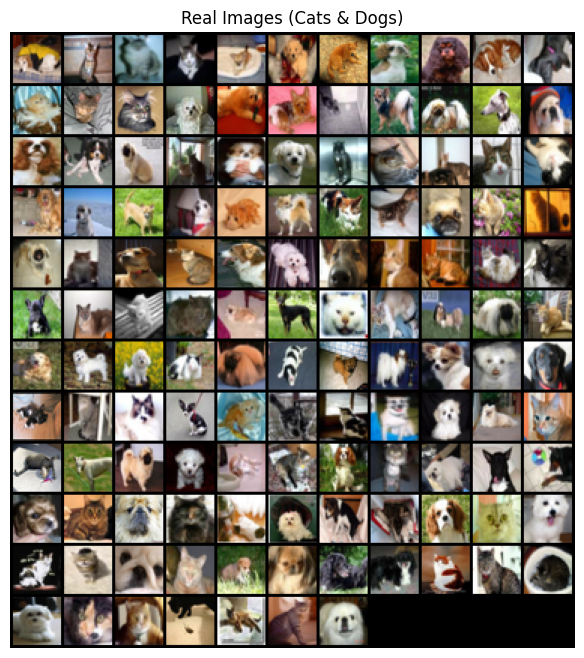

In [2]:
# -------------------------
# Hyperparameters and Settings
# -------------------------
BATCH_SIZE = 128
LR = 1e-4                           # lower LR for WGAN-GP is common
NUM_EPOCHS = 400                    # you may train longer if needed
NOISE_DIM = 128                     # latent dimension for GAN generator
NUM_TEST_SAMPLES = 16               # fixed noise sample count for GAN monitoring
IMAGE_SIZE = 32                   # CIFAR-10 images are 32x32
CHANNELS = 3
VAE_LATENT_DIM = 100                # latent dimension for VAE

# WGAN-GP Gradient Penalty lambda coefficient
LAMBDA_GP = 10

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

# -------------------------
# Data Loading and Filtering for Cats and Dogs
# -------------------------
def load_data():
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5,)*3, (0.5,)*3)
    ])
    dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    return dataset

def filter_cats_dogs(dataset):
    indices = [i for i, label in enumerate(dataset.targets) if label in [3, 5]]
    filtered_dataset = Subset(dataset, indices)
    return filtered_dataset

data = load_data()
filtered_data = filter_cats_dogs(data)
data_loader = DataLoader(filtered_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

def show_images(images, title="Images"):
    grid = vutils.make_grid(images, nrow=int(np.sqrt(images.shape[0])), normalize=True, scale_each=True)
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(grid.cpu().numpy(), (1,2,0)))
    plt.title(title)
    plt.axis("off")
    plt.show()

# Display some real images
data_iter = iter(data_loader)
images, _ = next(data_iter)
show_images(images, title="Real Images (Cats & Dogs)")

In [3]:
# -------------------------
# GAN Model Definitions (WGAN-GP)
# -------------------------

# Generator: outputs 32x32 images from a noise vector
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.linear = nn.Linear(NOISE_DIM, 1024 * 4 * 4)
        self.deconv1 = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )
        self.deconv2 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        # One deconvolution block to reach 32x32 output.
        self.deconv3 = nn.Sequential(
            nn.ConvTranspose2d(256, CHANNELS, 4, 2, 1, bias=False)
        )
        self.output = nn.Tanh()

    def forward(self, x):
        x = self.linear(x)
        x = x.view(x.shape[0], 1024, 4, 4)
        x = self.deconv1(x)  # becomes 8x8
        x = self.deconv2(x)  # becomes 16x16
        x = self.deconv3(x)  # becomes 32x32
        return self.output(x)

In [4]:
# Discriminator (Critic) with spectral normalization
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # Use spectral normalization on every conv layer.
        self.conv1 = nn.Sequential(
            spectral_norm(nn.Conv2d(CHANNELS, 128, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv2 = nn.Sequential(
            spectral_norm(nn.Conv2d(128, 256, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv3 = nn.Sequential(
            spectral_norm(nn.Conv2d(256, 512, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv4 = nn.Sequential(
            spectral_norm(nn.Conv2d(512, 1024, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True)
        )
        # For 32x32 input: 32 -> 16 -> 8 -> 4 -> 2, so feature map is 2x2.
        self.fc = nn.Linear(1024 * 2 * 2, 1)
        # Note: For WGAN we do not use a Sigmoid activation.
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = x.view(x.size(0), -1)
        out = self.fc(x)
        return out

In [5]:
# -------------------------
# VAE Model Definitions
# -------------------------

class VAE(nn.Module):
    def __init__(self, channels, latent_dim):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(channels, 64, 4, 2, 1),    # 32->16
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1),           # 16->8
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1),          # 8->4
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.flat_dim = 256 * 4 * 4
        self.fc_mu = nn.Linear(self.flat_dim, latent_dim)
        self.fc_logvar = nn.Linear(self.flat_dim, latent_dim)
        
        self.decoder_fc = nn.Linear(latent_dim, self.flat_dim)
        self.decoder = nn.Sequential(
            nn.Unflatten(1, (256, 4, 4)),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),  # 4->8
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),   # 8->16
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, channels, 4, 2, 1),  # 16->32
            nn.Tanh()
        )
        
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
        
    def forward(self, x):
        h = self.encoder(x)
        h = h.view(x.size(0), -1)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        z = self.reparameterize(mu, logvar)
        h_dec = self.decoder_fc(z)
        recon_x = self.decoder(h_dec)
        return recon_x, mu, logvar

In [6]:
# -------------------------
# Weight Initialization
# -------------------------
def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Initialize models
generator = Generator().to(device)
discriminator = Discriminator().to(device)
vae = VAE(CHANNELS, VAE_LATENT_DIM).to(device)

generator.apply(init_weights)
discriminator.apply(init_weights)
vae.apply(init_weights)  # optional

VAE(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU(inplace=True)
  )
  (fc_mu): Linear(in_features=4096, out_features=100, bias=True)
  (fc_logvar): Linear(in_features=4096, out_features=100, bias=True)
  (decoder_fc): Linear(in_features=100, out_features=4096, bias=True)
  (decoder): Sequential(
    (0): Unflatten(dim=1, unflattened_size=(256, 4, 4))
    (1): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU(

In [7]:
# -------------------------
# Optimizers
# -------------------------
g_optimizer = optim.Adam(generator.parameters(), lr=LR, betas=(0.0, 0.9))
d_optimizer = optim.Adam(discriminator.parameters(), lr=LR, betas=(0.0, 0.9))
vae_optimizer = optim.Adam(vae.parameters(), lr=LR)

# -------------------------
# Helper Functions for WGAN-GP
# -------------------------
def compute_gradient_penalty(D, real_samples, fake_samples):
    alpha = torch.rand(real_samples.size(0), 1, 1, 1).to(device)
    interpolates = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
    d_interpolates = D(interpolates)
    fake = torch.ones(real_samples.size(0), 1).to(device)
    
    gradients = grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

In [8]:
# -------------------------
# VAE Loss Function
# -------------------------
def vae_loss(recon_x, x, mu, logvar):
    recon_loss = nn.functional.mse_loss(recon_x, x, reduction='sum')
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + kl_loss

# -------------------------
# Noise Utility for GAN
# -------------------------
def sample_noise(size):
    z = Variable(torch.randn(size, NOISE_DIM))
    return z.to(device)

# -------------------------
# Fixed noise for GAN output monitoring
# -------------------------
fixed_noise = sample_noise(NUM_TEST_SAMPLES)

# -------------------------
# Image Display Helper
# -------------------------
def generate_and_display_images(images, num_images, title="Generated Images"):
    grid = vutils.make_grid(images, nrow=int(np.sqrt(num_images)), normalize=True, scale_each=True)
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(grid.cpu().detach().numpy(), (1,2,0)))
    plt.title(title)
    plt.axis("off")
    display.display(plt.gcf())
    plt.close()

Starting Training Loop...


/usr/local/lib/python3.11/dist-packages/torch/autograd/graph.py:825: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at ../aten/src/ATen/cuda/CublasHandlePool.cpp:135.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
  0% (0 of 400) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

Epoch [1/400] - GAN D Loss: 1.1814, G Loss: -0.2181, VAE Loss: 100446.2930


  0% (1 of 400) |                        | Elapsed Time: 0:00:16 ETA:   1:48:01

Epoch [2/400] - GAN D Loss: 0.4982, G Loss: -0.1705, VAE Loss: 93995.0374


  0% (2 of 400) |                        | Elapsed Time: 0:00:32 ETA:   1:47:46

Epoch [3/400] - GAN D Loss: 0.3197, G Loss: -0.1353, VAE Loss: 69497.1283


  0% (3 of 400) |                        | Elapsed Time: 0:00:48 ETA:   1:47:25

Epoch [4/400] - GAN D Loss: 0.1487, G Loss: -0.0856, VAE Loss: 52910.2549


  1% (4 of 400) |                        | Elapsed Time: 0:01:04 ETA:   1:47:04

Epoch [5/400] - GAN D Loss: 0.0130, G Loss: -0.0250, VAE Loss: 46033.7599


  1% (5 of 400) |                        | Elapsed Time: 0:01:21 ETA:   1:46:49

Epoch [6/400] - GAN D Loss: 0.1390, G Loss: 0.0412, VAE Loss: 42689.2215


  1% (6 of 400) |                        | Elapsed Time: 0:01:37 ETA:   1:46:37

Epoch [7/400] - GAN D Loss: -0.3180, G Loss: 0.2196, VAE Loss: 40264.8818


  1% (7 of 400) |                        | Elapsed Time: 0:01:53 ETA:   1:46:24

Epoch [8/400] - GAN D Loss: -0.7575, G Loss: 0.4213, VAE Loss: 38309.9068


  2% (8 of 400) |                        | Elapsed Time: 0:02:10 ETA:   1:46:13

Epoch [9/400] - GAN D Loss: -1.3520, G Loss: 0.7391, VAE Loss: 36801.0829


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [10/400] - GAN D Loss: -1.5572, G Loss: 0.8275, VAE Loss: 35513.9021


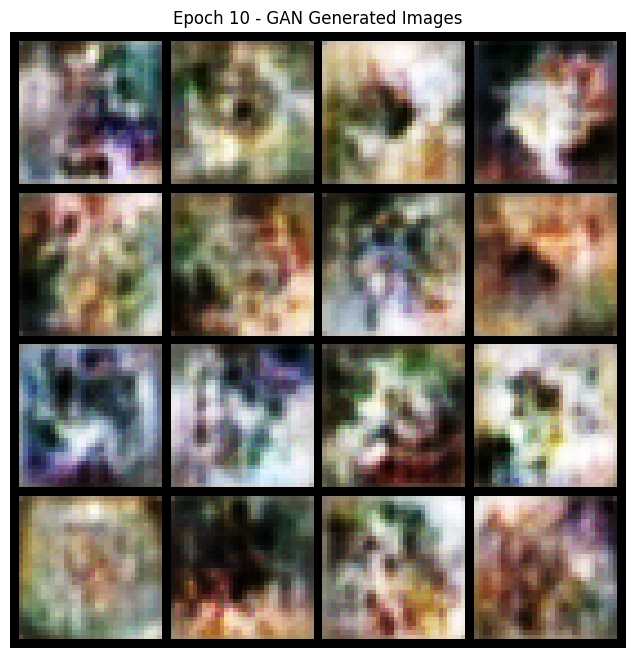

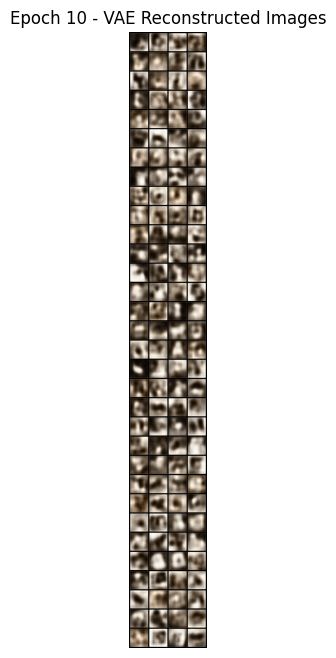

  2% (10 of 400) |                       | Elapsed Time: 0:02:43 ETA:   1:46:11

Epoch [11/400] - GAN D Loss: -1.2789, G Loss: 0.6864, VAE Loss: 34728.5167


  2% (11 of 400) |                       | Elapsed Time: 0:02:59 ETA:   1:45:56

Epoch [12/400] - GAN D Loss: -1.1562, G Loss: 0.6477, VAE Loss: 33711.0416


  3% (12 of 400) |                       | Elapsed Time: 0:03:16 ETA:   1:45:41

Epoch [13/400] - GAN D Loss: -1.0251, G Loss: 0.5919, VAE Loss: 33118.5417


  3% (13 of 400) |                       | Elapsed Time: 0:03:32 ETA:   1:45:25

Epoch [14/400] - GAN D Loss: -1.0961, G Loss: 0.6523, VAE Loss: 32430.6332


  3% (14 of 400) |                       | Elapsed Time: 0:03:48 ETA:   1:45:09

Epoch [15/400] - GAN D Loss: -1.2132, G Loss: 0.7036, VAE Loss: 31930.5513


  3% (15 of 400) |                       | Elapsed Time: 0:04:05 ETA:   1:44:53

Epoch [16/400] - GAN D Loss: -1.2782, G Loss: 0.8078, VAE Loss: 31501.8663


  4% (16 of 400) |                       | Elapsed Time: 0:04:21 ETA:   1:44:36

Epoch [17/400] - GAN D Loss: -1.2781, G Loss: 0.7434, VAE Loss: 31034.5139


  4% (17 of 400) |                       | Elapsed Time: 0:04:37 ETA:   1:44:20

Epoch [18/400] - GAN D Loss: -1.3789, G Loss: 0.8219, VAE Loss: 30632.1924


  4% (18 of 400) |#                      | Elapsed Time: 0:04:54 ETA:   1:44:04

Epoch [19/400] - GAN D Loss: -1.4366, G Loss: 0.8044, VAE Loss: 30300.3422


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [20/400] - GAN D Loss: -1.4683, G Loss: 0.7194, VAE Loss: 30077.2098


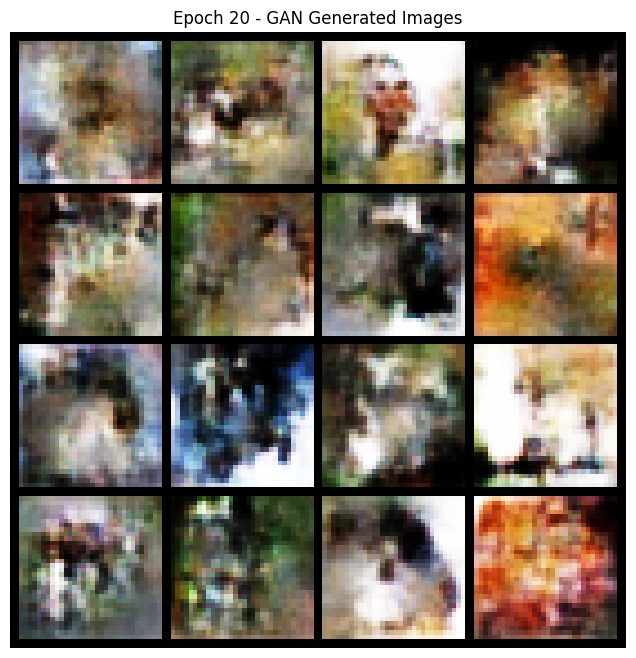

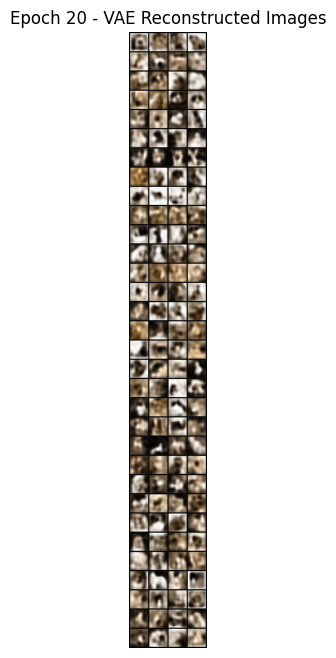

  5% (20 of 400) |#                      | Elapsed Time: 0:05:27 ETA:   1:43:39

Epoch [21/400] - GAN D Loss: -1.4511, G Loss: 0.6809, VAE Loss: 29777.5328


  5% (21 of 400) |#                      | Elapsed Time: 0:05:43 ETA:   1:43:23

Epoch [22/400] - GAN D Loss: -1.4782, G Loss: 0.6873, VAE Loss: 29610.2225


  5% (22 of 400) |#                      | Elapsed Time: 0:06:00 ETA:   1:43:06

Epoch [23/400] - GAN D Loss: -1.4562, G Loss: 0.6417, VAE Loss: 29300.4847


  5% (23 of 400) |#                      | Elapsed Time: 0:06:16 ETA:   1:42:49

Epoch [24/400] - GAN D Loss: -1.5017, G Loss: 0.6574, VAE Loss: 28444.6918


  6% (24 of 400) |#                      | Elapsed Time: 0:06:32 ETA:   1:42:33

Epoch [25/400] - GAN D Loss: -1.3847, G Loss: 0.5673, VAE Loss: 27908.2257


  6% (25 of 400) |#                      | Elapsed Time: 0:06:49 ETA:   1:42:17

Epoch [26/400] - GAN D Loss: -1.2944, G Loss: 0.5877, VAE Loss: 27615.9679


  6% (26 of 400) |#                      | Elapsed Time: 0:07:05 ETA:   1:42:01

Epoch [27/400] - GAN D Loss: -1.2130, G Loss: 0.5736, VAE Loss: 27390.9983


  6% (27 of 400) |#                      | Elapsed Time: 0:07:21 ETA:   1:41:45

Epoch [28/400] - GAN D Loss: -1.1931, G Loss: 0.4837, VAE Loss: 27248.7762


  7% (28 of 400) |#                      | Elapsed Time: 0:07:38 ETA:   1:41:29

Epoch [29/400] - GAN D Loss: -1.1459, G Loss: 0.5085, VAE Loss: 26952.0956


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [30/400] - GAN D Loss: -1.1505, G Loss: 0.4531, VAE Loss: 26823.6819


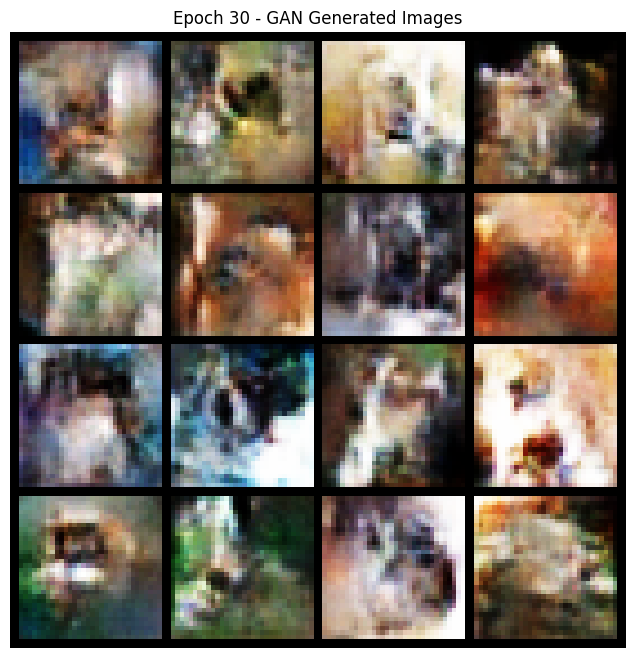

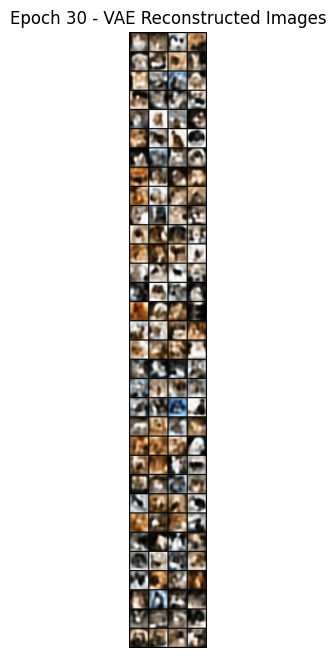

  7% (30 of 400) |#                      | Elapsed Time: 0:08:11 ETA:   1:41:01

Epoch [31/400] - GAN D Loss: -1.1077, G Loss: 0.3345, VAE Loss: 26694.4146


  7% (31 of 400) |#                      | Elapsed Time: 0:08:27 ETA:   1:40:45

Epoch [32/400] - GAN D Loss: -1.0988, G Loss: 0.2341, VAE Loss: 26490.7003


  8% (32 of 400) |#                      | Elapsed Time: 0:08:44 ETA:   1:40:28

Epoch [33/400] - GAN D Loss: -1.1383, G Loss: 0.2214, VAE Loss: 26352.4483


  8% (33 of 400) |#                      | Elapsed Time: 0:09:00 ETA:   1:40:11

Epoch [34/400] - GAN D Loss: -1.1347, G Loss: 0.2863, VAE Loss: 26274.6399


  8% (34 of 400) |#                      | Elapsed Time: 0:09:16 ETA:   1:39:54

Epoch [35/400] - GAN D Loss: -1.1358, G Loss: 0.2091, VAE Loss: 26163.1634


  8% (35 of 400) |##                     | Elapsed Time: 0:09:33 ETA:   1:39:37

Epoch [36/400] - GAN D Loss: -1.1369, G Loss: 0.1674, VAE Loss: 25972.2631


  9% (36 of 400) |##                     | Elapsed Time: 0:09:49 ETA:   1:39:20

Epoch [37/400] - GAN D Loss: -1.1390, G Loss: 0.0920, VAE Loss: 25827.6831


  9% (37 of 400) |##                     | Elapsed Time: 0:10:05 ETA:   1:39:03

Epoch [38/400] - GAN D Loss: -1.1541, G Loss: 0.1541, VAE Loss: 25782.4156


  9% (38 of 400) |##                     | Elapsed Time: 0:10:22 ETA:   1:38:47

Epoch [39/400] - GAN D Loss: -1.1337, G Loss: 0.1769, VAE Loss: 25675.2668


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [40/400] - GAN D Loss: -1.1348, G Loss: 0.0448, VAE Loss: 25554.3389


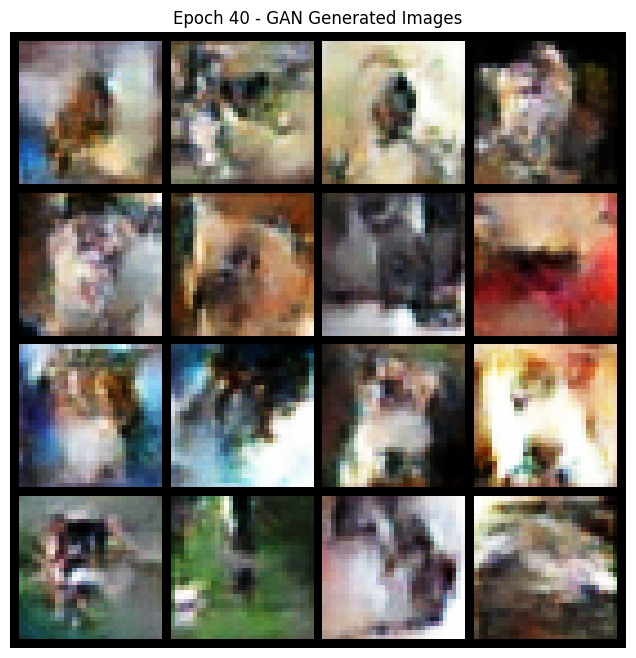

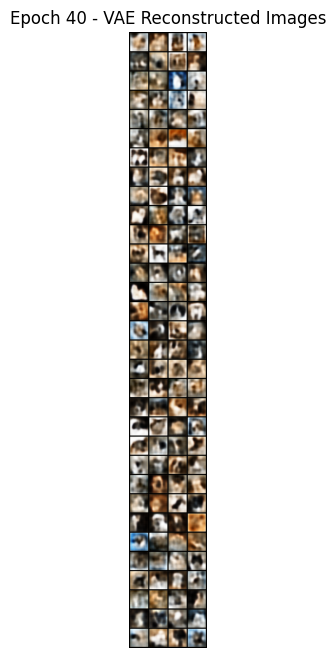

 10% (40 of 400) |##                     | Elapsed Time: 0:10:55 ETA:   1:38:18

Epoch [41/400] - GAN D Loss: -1.1474, G Loss: -0.0072, VAE Loss: 25564.4587


 10% (41 of 400) |##                     | Elapsed Time: 0:11:11 ETA:   1:38:01

Epoch [42/400] - GAN D Loss: -1.1134, G Loss: 0.0685, VAE Loss: 25467.0095


 10% (42 of 400) |##                     | Elapsed Time: 0:11:27 ETA:   1:37:44

Epoch [43/400] - GAN D Loss: -1.1271, G Loss: -0.0192, VAE Loss: 25352.1463


 10% (43 of 400) |##                     | Elapsed Time: 0:11:44 ETA:   1:37:27

Epoch [44/400] - GAN D Loss: -1.0929, G Loss: 0.0004, VAE Loss: 25301.8536


 11% (44 of 400) |##                     | Elapsed Time: 0:12:00 ETA:   1:37:10

Epoch [45/400] - GAN D Loss: -1.1312, G Loss: -0.0184, VAE Loss: 25237.9286


 11% (45 of 400) |##                     | Elapsed Time: 0:12:16 ETA:   1:36:53

Epoch [46/400] - GAN D Loss: -1.1190, G Loss: 0.0345, VAE Loss: 25224.3419


 11% (46 of 400) |##                     | Elapsed Time: 0:12:33 ETA:   1:36:36

Epoch [47/400] - GAN D Loss: -1.1015, G Loss: 0.0996, VAE Loss: 25066.0002


 11% (47 of 400) |##                     | Elapsed Time: 0:12:49 ETA:   1:36:19

Epoch [48/400] - GAN D Loss: -1.0807, G Loss: 0.0303, VAE Loss: 25023.1302


 12% (48 of 400) |##                     | Elapsed Time: 0:13:05 ETA:   1:36:03

Epoch [49/400] - GAN D Loss: -1.1187, G Loss: 0.0260, VAE Loss: 24983.8627


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [50/400] - GAN D Loss: -1.0405, G Loss: 0.0573, VAE Loss: 24966.0325


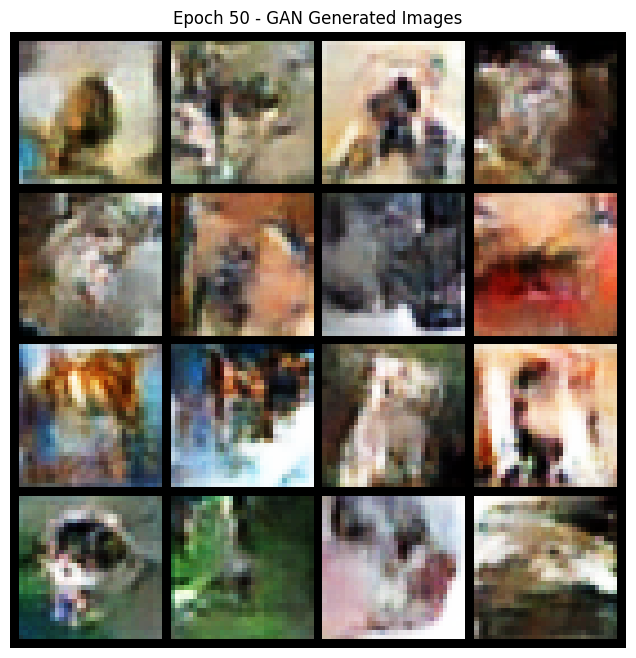

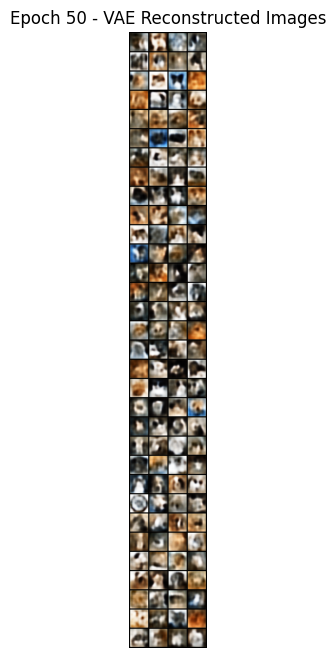

 12% (50 of 400) |##                     | Elapsed Time: 0:13:38 ETA:   1:35:32

Epoch [51/400] - GAN D Loss: -1.0163, G Loss: 0.0393, VAE Loss: 24929.3388


 12% (51 of 400) |##                     | Elapsed Time: 0:13:55 ETA:   1:35:16

Epoch [52/400] - GAN D Loss: -1.0760, G Loss: 0.0699, VAE Loss: 24873.0643


 13% (52 of 400) |##                     | Elapsed Time: 0:14:11 ETA:   1:34:59

Epoch [53/400] - GAN D Loss: -1.0773, G Loss: 0.0404, VAE Loss: 24881.3778


 13% (53 of 400) |###                    | Elapsed Time: 0:14:28 ETA:   1:34:43

Epoch [54/400] - GAN D Loss: -1.0664, G Loss: 0.0302, VAE Loss: 24798.7695


 13% (54 of 400) |###                    | Elapsed Time: 0:14:44 ETA:   1:34:26

Epoch [55/400] - GAN D Loss: -1.1093, G Loss: -0.0100, VAE Loss: 24781.0557


 13% (55 of 400) |###                    | Elapsed Time: 0:15:00 ETA:   1:34:09

Epoch [56/400] - GAN D Loss: -1.0313, G Loss: 0.1380, VAE Loss: 24750.0420


 14% (56 of 400) |###                    | Elapsed Time: 0:15:16 ETA:   1:33:52

Epoch [57/400] - GAN D Loss: -1.0758, G Loss: 0.1023, VAE Loss: 24653.7939


 14% (57 of 400) |###                    | Elapsed Time: 0:15:33 ETA:   1:33:36

Epoch [58/400] - GAN D Loss: -1.0487, G Loss: 0.0611, VAE Loss: 24648.9456


 14% (58 of 400) |###                    | Elapsed Time: 0:15:49 ETA:   1:33:19

Epoch [59/400] - GAN D Loss: -1.0841, G Loss: 0.1018, VAE Loss: 24571.2212


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [60/400] - GAN D Loss: -1.0703, G Loss: 0.1833, VAE Loss: 24525.9934


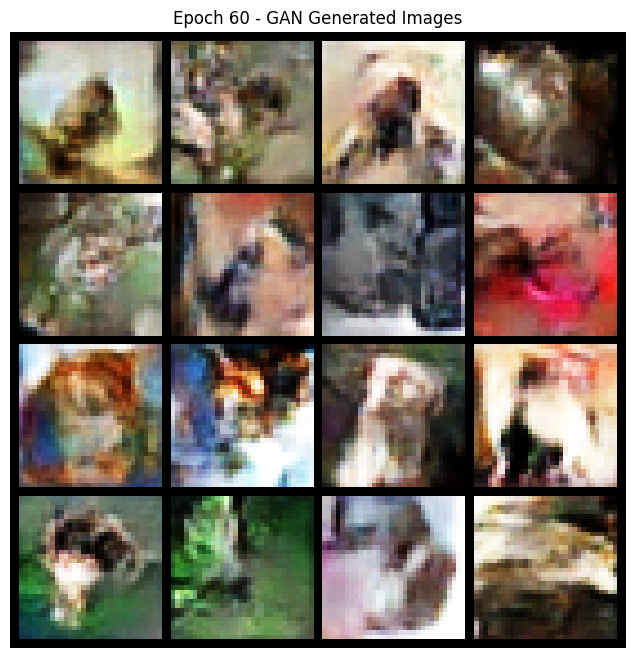

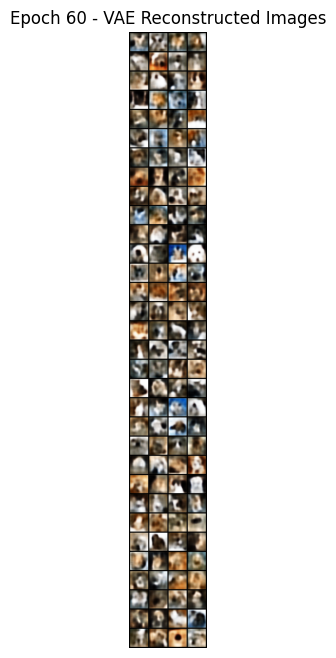

 15% (60 of 400) |###                    | Elapsed Time: 0:16:22 ETA:   1:32:48

Epoch [61/400] - GAN D Loss: -1.0924, G Loss: 0.1060, VAE Loss: 24535.4105


 15% (61 of 400) |###                    | Elapsed Time: 0:16:39 ETA:   1:32:31

Epoch [62/400] - GAN D Loss: -1.0860, G Loss: 0.1200, VAE Loss: 24536.4184


 15% (62 of 400) |###                    | Elapsed Time: 0:16:55 ETA:   1:32:15

Epoch [63/400] - GAN D Loss: -1.0673, G Loss: 0.1777, VAE Loss: 24459.4981


 15% (63 of 400) |###                    | Elapsed Time: 0:17:11 ETA:   1:31:58

Epoch [64/400] - GAN D Loss: -1.0807, G Loss: 0.1975, VAE Loss: 24460.8208


 16% (64 of 400) |###                    | Elapsed Time: 0:17:28 ETA:   1:31:42

Epoch [65/400] - GAN D Loss: -1.1202, G Loss: 0.1290, VAE Loss: 24374.3040


 16% (65 of 400) |###                    | Elapsed Time: 0:17:44 ETA:   1:31:25

Epoch [66/400] - GAN D Loss: -1.0897, G Loss: 0.1030, VAE Loss: 24366.8818


 16% (66 of 400) |###                    | Elapsed Time: 0:18:00 ETA:   1:31:09

Epoch [67/400] - GAN D Loss: -1.1357, G Loss: 0.1835, VAE Loss: 24359.6672


 16% (67 of 400) |###                    | Elapsed Time: 0:18:17 ETA:   1:30:52

Epoch [68/400] - GAN D Loss: -1.1378, G Loss: 0.1790, VAE Loss: 24238.2366


 17% (68 of 400) |###                    | Elapsed Time: 0:18:33 ETA:   1:30:36

Epoch [69/400] - GAN D Loss: -1.1113, G Loss: 0.0930, VAE Loss: 24302.0790


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [70/400] - GAN D Loss: -1.1281, G Loss: 0.1799, VAE Loss: 24299.3984


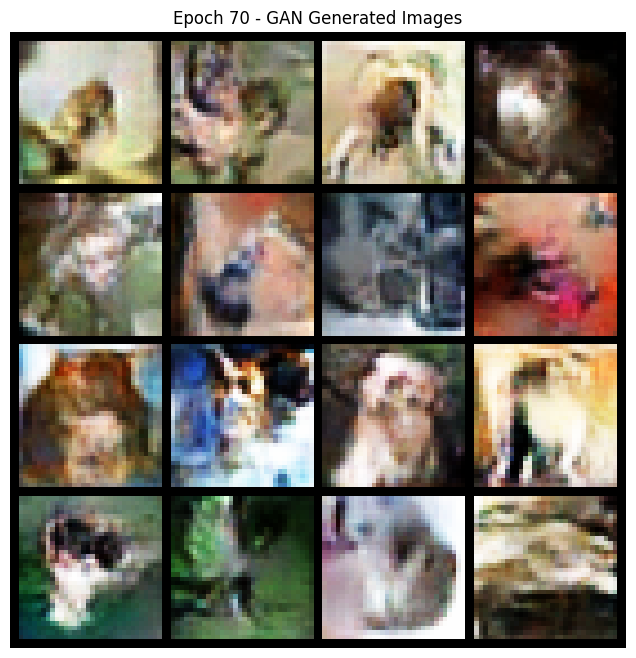

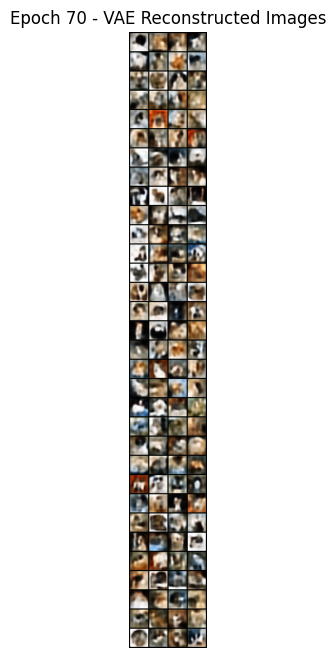

 17% (70 of 400) |####                   | Elapsed Time: 0:19:06 ETA:   1:30:04

Epoch [71/400] - GAN D Loss: -1.1497, G Loss: 0.1698, VAE Loss: 24253.0596


 17% (71 of 400) |####                   | Elapsed Time: 0:19:22 ETA:   1:29:47

Epoch [72/400] - GAN D Loss: -1.1710, G Loss: 0.2936, VAE Loss: 24257.1106


 18% (72 of 400) |####                   | Elapsed Time: 0:19:39 ETA:   1:29:31

Epoch [73/400] - GAN D Loss: -1.1323, G Loss: 0.2527, VAE Loss: 24219.7341


 18% (73 of 400) |####                   | Elapsed Time: 0:19:55 ETA:   1:29:14

Epoch [74/400] - GAN D Loss: -1.1645, G Loss: 0.2501, VAE Loss: 24221.7009


 18% (74 of 400) |####                   | Elapsed Time: 0:20:11 ETA:   1:28:57

Epoch [75/400] - GAN D Loss: -1.1683, G Loss: 0.2096, VAE Loss: 24258.3768


 18% (75 of 400) |####                   | Elapsed Time: 0:20:27 ETA:   1:28:41

Epoch [76/400] - GAN D Loss: -1.1666, G Loss: 0.2337, VAE Loss: 24193.4182


 19% (76 of 400) |####                   | Elapsed Time: 0:20:44 ETA:   1:28:24

Epoch [77/400] - GAN D Loss: -1.1952, G Loss: 0.1821, VAE Loss: 24109.3845


 19% (77 of 400) |####                   | Elapsed Time: 0:21:00 ETA:   1:28:07

Epoch [78/400] - GAN D Loss: -1.2317, G Loss: 0.0684, VAE Loss: 24078.1147


 19% (78 of 400) |####                   | Elapsed Time: 0:21:16 ETA:   1:27:51

Epoch [79/400] - GAN D Loss: -1.2363, G Loss: 0.0912, VAE Loss: 24033.5365


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [80/400] - GAN D Loss: -1.2991, G Loss: 0.1472, VAE Loss: 24022.5127


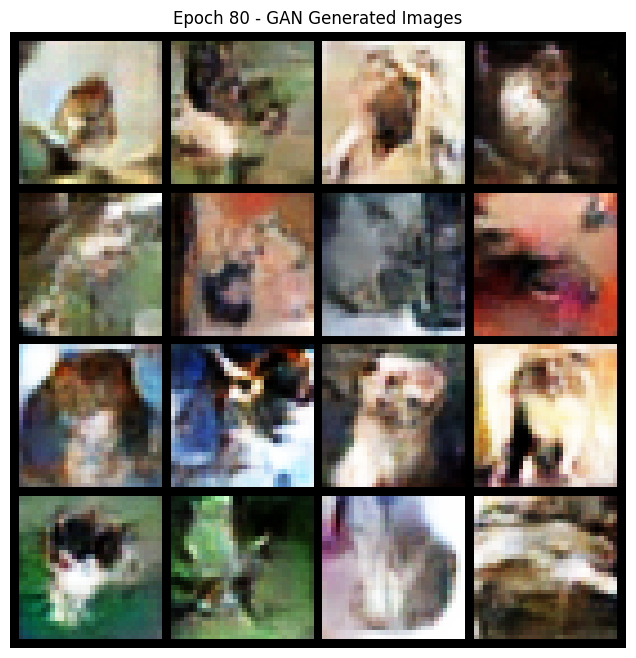

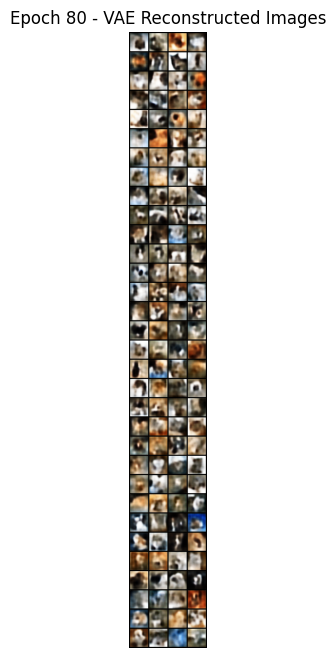

 20% (80 of 400) |####                   | Elapsed Time: 0:21:49 ETA:   1:27:19

Epoch [81/400] - GAN D Loss: -1.2606, G Loss: 0.0974, VAE Loss: 23993.5759


 20% (81 of 400) |####                   | Elapsed Time: 0:22:06 ETA:   1:27:03

Epoch [82/400] - GAN D Loss: -1.1616, G Loss: 0.1825, VAE Loss: 24040.4586


 20% (82 of 400) |####                   | Elapsed Time: 0:22:22 ETA:   1:26:46

Epoch [83/400] - GAN D Loss: -1.3420, G Loss: 0.1443, VAE Loss: 23948.9741


 20% (83 of 400) |####                   | Elapsed Time: 0:22:38 ETA:   1:26:30

Epoch [84/400] - GAN D Loss: -1.2603, G Loss: -0.0207, VAE Loss: 23955.2315


 21% (84 of 400) |####                   | Elapsed Time: 0:22:55 ETA:   1:26:13

Epoch [85/400] - GAN D Loss: -1.2772, G Loss: 0.2050, VAE Loss: 23914.8197


 21% (85 of 400) |####                   | Elapsed Time: 0:23:11 ETA:   1:25:56

Epoch [86/400] - GAN D Loss: -1.2647, G Loss: 0.2517, VAE Loss: 23931.9421


 21% (86 of 400) |####                   | Elapsed Time: 0:23:27 ETA:   1:25:40

Epoch [87/400] - GAN D Loss: -1.3436, G Loss: 0.2079, VAE Loss: 23908.7716


 21% (87 of 400) |#####                  | Elapsed Time: 0:23:44 ETA:   1:25:23

Epoch [88/400] - GAN D Loss: -1.3755, G Loss: 0.2144, VAE Loss: 23888.7788


 22% (88 of 400) |#####                  | Elapsed Time: 0:24:00 ETA:   1:25:07

Epoch [89/400] - GAN D Loss: -1.3523, G Loss: 0.1152, VAE Loss: 23929.1711


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [90/400] - GAN D Loss: -1.4361, G Loss: 0.1704, VAE Loss: 23882.5032


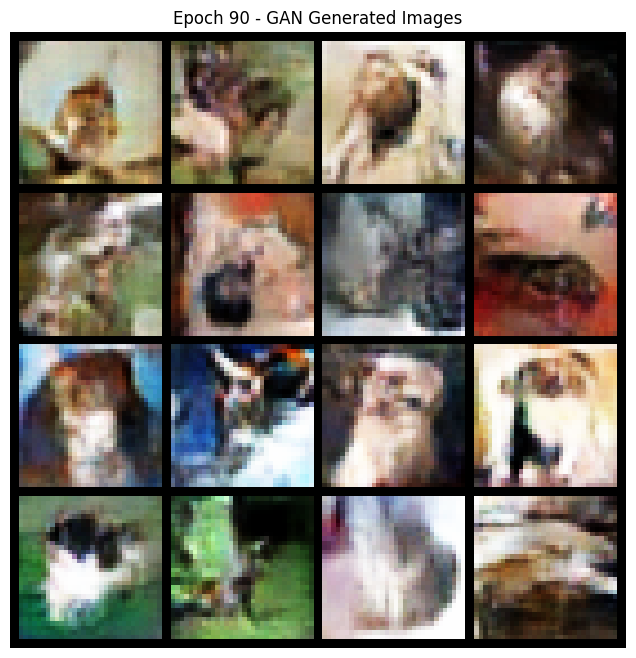

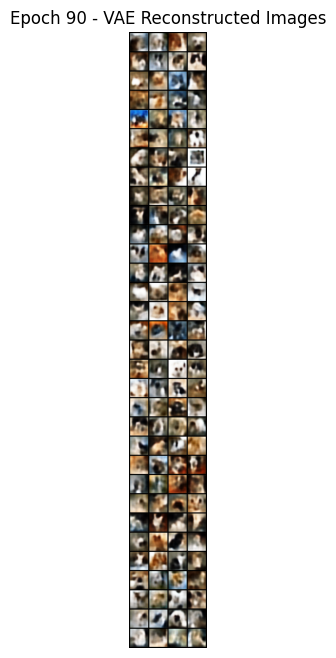

 22% (90 of 400) |#####                  | Elapsed Time: 0:24:33 ETA:   1:24:35

Epoch [91/400] - GAN D Loss: -1.2767, G Loss: 0.2524, VAE Loss: 23803.3790


 22% (91 of 400) |#####                  | Elapsed Time: 0:24:49 ETA:   1:24:18

Epoch [92/400] - GAN D Loss: -1.4151, G Loss: 0.2010, VAE Loss: 23825.2012


 23% (92 of 400) |#####                  | Elapsed Time: 0:25:06 ETA:   1:24:02

Epoch [93/400] - GAN D Loss: -1.3298, G Loss: 0.1723, VAE Loss: 23789.2626


 23% (93 of 400) |#####                  | Elapsed Time: 0:25:22 ETA:   1:23:45

Epoch [94/400] - GAN D Loss: -1.3968, G Loss: 0.3129, VAE Loss: 23754.6502


 23% (94 of 400) |#####                  | Elapsed Time: 0:25:38 ETA:   1:23:29

Epoch [95/400] - GAN D Loss: -1.3704, G Loss: 0.1359, VAE Loss: 23784.5411


 23% (95 of 400) |#####                  | Elapsed Time: 0:25:55 ETA:   1:23:12

Epoch [96/400] - GAN D Loss: -1.3792, G Loss: 0.1822, VAE Loss: 23721.9673


 24% (96 of 400) |#####                  | Elapsed Time: 0:26:11 ETA:   1:22:56

Epoch [97/400] - GAN D Loss: -1.4309, G Loss: 0.1264, VAE Loss: 23726.9067


 24% (97 of 400) |#####                  | Elapsed Time: 0:26:27 ETA:   1:22:39

Epoch [98/400] - GAN D Loss: -1.3953, G Loss: 0.2551, VAE Loss: 23680.1619


 24% (98 of 400) |#####                  | Elapsed Time: 0:26:44 ETA:   1:22:23

Epoch [99/400] - GAN D Loss: -1.5114, G Loss: 0.1444, VAE Loss: 23670.9689


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [100/400] - GAN D Loss: -1.5132, G Loss: 0.1786, VAE Loss: 23721.3694


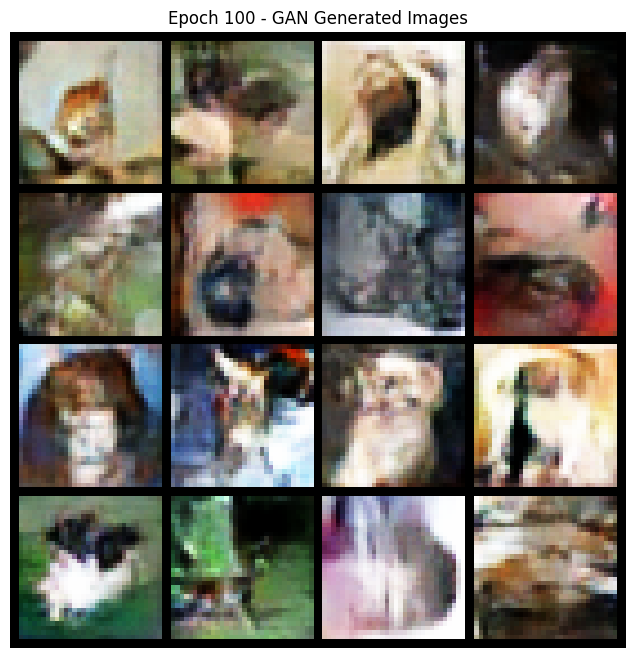

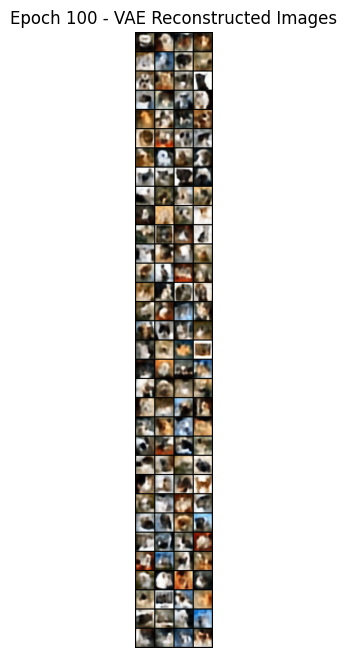

 25% (100 of 400) |#####                 | Elapsed Time: 0:27:17 ETA:   1:21:51

Epoch [101/400] - GAN D Loss: -1.5436, G Loss: 0.1781, VAE Loss: 23654.1191


 25% (101 of 400) |#####                 | Elapsed Time: 0:27:33 ETA:   1:21:34

Epoch [102/400] - GAN D Loss: -1.4436, G Loss: 0.1090, VAE Loss: 23670.7129


 25% (102 of 400) |#####                 | Elapsed Time: 0:27:49 ETA:   1:21:18

Epoch [103/400] - GAN D Loss: -1.5593, G Loss: 0.0877, VAE Loss: 23655.0199


 25% (103 of 400) |#####                 | Elapsed Time: 0:28:06 ETA:   1:21:01

Epoch [104/400] - GAN D Loss: -1.5762, G Loss: 0.2037, VAE Loss: 23702.1345


 26% (104 of 400) |#####                 | Elapsed Time: 0:28:22 ETA:   1:20:45

Epoch [105/400] - GAN D Loss: -1.4736, G Loss: 0.2838, VAE Loss: 23603.2938


 26% (105 of 400) |#####                 | Elapsed Time: 0:28:38 ETA:   1:20:28

Epoch [106/400] - GAN D Loss: -1.5675, G Loss: 0.4352, VAE Loss: 23546.9525


 26% (106 of 400) |#####                 | Elapsed Time: 0:28:55 ETA:   1:20:12

Epoch [107/400] - GAN D Loss: -1.6696, G Loss: 0.0998, VAE Loss: 23553.2747


 26% (107 of 400) |#####                 | Elapsed Time: 0:29:11 ETA:   1:19:56

Epoch [108/400] - GAN D Loss: -1.5879, G Loss: 0.3671, VAE Loss: 23562.3693


 27% (108 of 400) |#####                 | Elapsed Time: 0:29:27 ETA:   1:19:39

Epoch [109/400] - GAN D Loss: -1.5987, G Loss: 0.0464, VAE Loss: 23589.5674


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [110/400] - GAN D Loss: -1.7887, G Loss: -0.0140, VAE Loss: 23537.4144


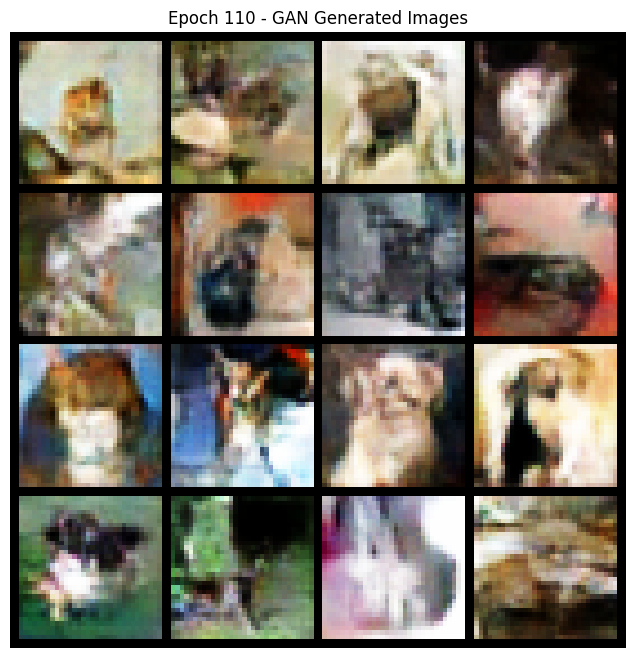

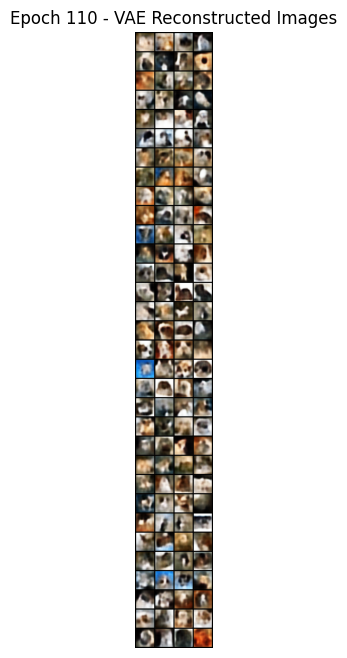

 27% (110 of 400) |######                | Elapsed Time: 0:30:00 ETA:   1:19:07

Epoch [111/400] - GAN D Loss: -1.6369, G Loss: 0.2164, VAE Loss: 23547.7918


 27% (111 of 400) |######                | Elapsed Time: 0:30:17 ETA:   1:18:50

Epoch [112/400] - GAN D Loss: -1.7118, G Loss: 0.0841, VAE Loss: 23504.8504


 28% (112 of 400) |######                | Elapsed Time: 0:30:33 ETA:   1:18:34

Epoch [113/400] - GAN D Loss: -1.6848, G Loss: 0.1760, VAE Loss: 23487.1628


 28% (113 of 400) |######                | Elapsed Time: 0:30:49 ETA:   1:18:17

Epoch [114/400] - GAN D Loss: -1.7668, G Loss: 0.1401, VAE Loss: 23482.2957


 28% (114 of 400) |######                | Elapsed Time: 0:31:06 ETA:   1:18:01

Epoch [115/400] - GAN D Loss: -1.6354, G Loss: 0.1767, VAE Loss: 23507.0259


 28% (115 of 400) |######                | Elapsed Time: 0:31:22 ETA:   1:17:44

Epoch [116/400] - GAN D Loss: -1.7843, G Loss: 0.1693, VAE Loss: 23502.0439


 29% (116 of 400) |######                | Elapsed Time: 0:31:38 ETA:   1:17:28

Epoch [117/400] - GAN D Loss: -1.7538, G Loss: 0.0895, VAE Loss: 23470.1826


 29% (117 of 400) |######                | Elapsed Time: 0:31:54 ETA:   1:17:11

Epoch [118/400] - GAN D Loss: -1.9132, G Loss: 0.1160, VAE Loss: 23404.2707


 29% (118 of 400) |######                | Elapsed Time: 0:32:11 ETA:   1:16:55

Epoch [119/400] - GAN D Loss: -1.8346, G Loss: 0.1513, VAE Loss: 23424.9805


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [120/400] - GAN D Loss: -1.8468, G Loss: 0.1469, VAE Loss: 23436.2502


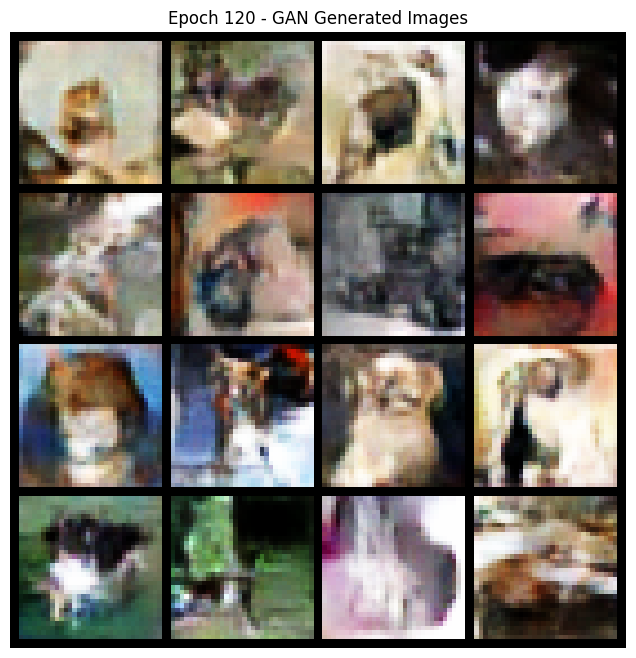

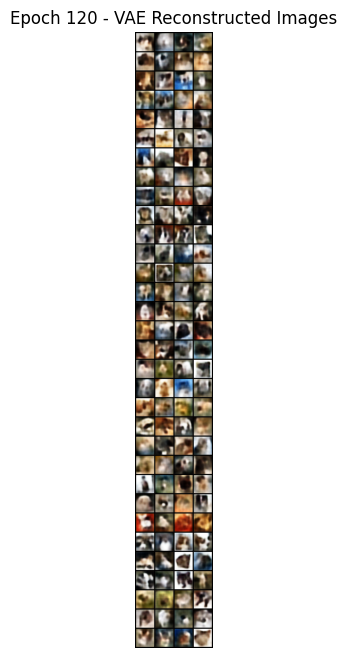

 30% (120 of 400) |######                | Elapsed Time: 0:32:44 ETA:   1:16:23

Epoch [121/400] - GAN D Loss: -1.8061, G Loss: 0.1732, VAE Loss: 23369.5261


 30% (121 of 400) |######                | Elapsed Time: 0:33:00 ETA:   1:16:07

Epoch [122/400] - GAN D Loss: -1.9422, G Loss: -0.0034, VAE Loss: 23410.0531


 30% (122 of 400) |######                | Elapsed Time: 0:33:17 ETA:   1:15:50

Epoch [123/400] - GAN D Loss: -1.8247, G Loss: 0.1454, VAE Loss: 23315.6947


 30% (123 of 400) |######                | Elapsed Time: 0:33:33 ETA:   1:15:34

Epoch [124/400] - GAN D Loss: -1.7673, G Loss: 0.3674, VAE Loss: 23277.8474


 31% (124 of 400) |######                | Elapsed Time: 0:33:49 ETA:   1:15:17

Epoch [125/400] - GAN D Loss: -1.9128, G Loss: 0.2463, VAE Loss: 23243.7233


 31% (125 of 400) |######                | Elapsed Time: 0:34:05 ETA:   1:15:01

Epoch [126/400] - GAN D Loss: -1.9630, G Loss: 0.0954, VAE Loss: 23270.9636


 31% (126 of 400) |######                | Elapsed Time: 0:34:22 ETA:   1:14:44

Epoch [127/400] - GAN D Loss: -2.0199, G Loss: 0.1743, VAE Loss: 23211.6582


 31% (127 of 400) |######                | Elapsed Time: 0:34:38 ETA:   1:14:28

Epoch [128/400] - GAN D Loss: -1.8964, G Loss: 0.4394, VAE Loss: 23175.5382


 32% (128 of 400) |#######               | Elapsed Time: 0:34:54 ETA:   1:14:11

Epoch [129/400] - GAN D Loss: -1.9700, G Loss: 0.1933, VAE Loss: 23137.9028


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [130/400] - GAN D Loss: -2.0069, G Loss: 0.3215, VAE Loss: 23150.0837


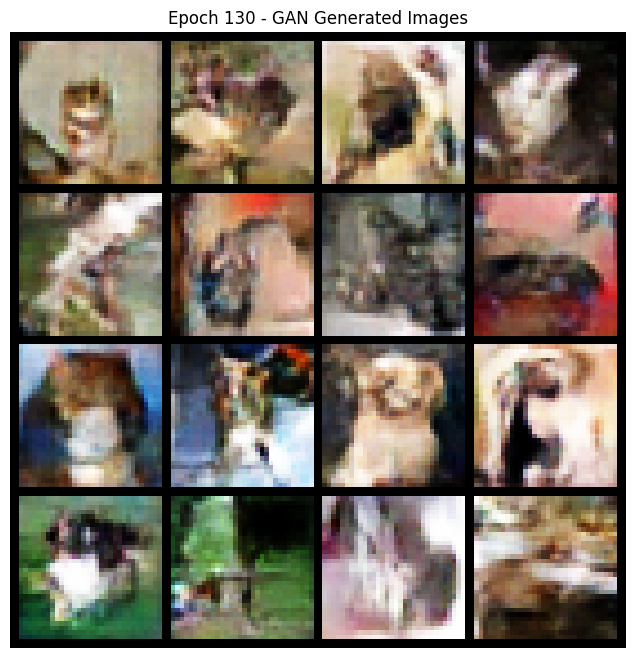

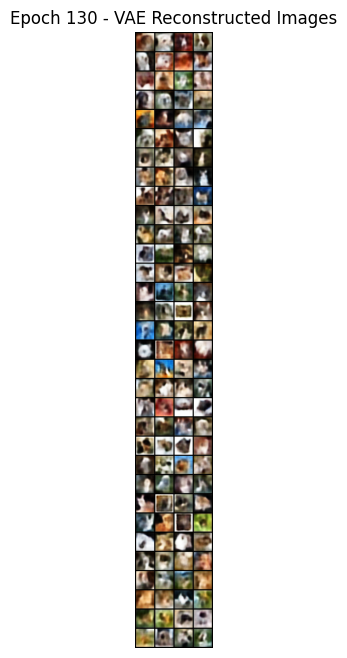

 32% (130 of 400) |#######               | Elapsed Time: 0:35:27 ETA:   1:13:39

Epoch [131/400] - GAN D Loss: -2.2864, G Loss: 0.1522, VAE Loss: 23108.2744


 32% (131 of 400) |#######               | Elapsed Time: 0:35:44 ETA:   1:13:23

Epoch [132/400] - GAN D Loss: -1.6696, G Loss: 0.1958, VAE Loss: 23082.0685


 33% (132 of 400) |#######               | Elapsed Time: 0:36:00 ETA:   1:13:06

Epoch [133/400] - GAN D Loss: -2.1117, G Loss: 0.1152, VAE Loss: 23117.6862


 33% (133 of 400) |#######               | Elapsed Time: 0:36:16 ETA:   1:12:50

Epoch [134/400] - GAN D Loss: -2.2542, G Loss: 0.2229, VAE Loss: 23104.5637


 33% (134 of 400) |#######               | Elapsed Time: 0:36:33 ETA:   1:12:33

Epoch [135/400] - GAN D Loss: -2.0018, G Loss: 0.1414, VAE Loss: 23076.0564


 33% (135 of 400) |#######               | Elapsed Time: 0:36:49 ETA:   1:12:17

Epoch [136/400] - GAN D Loss: -1.9892, G Loss: 0.1401, VAE Loss: 23042.3443


 34% (136 of 400) |#######               | Elapsed Time: 0:37:05 ETA:   1:12:00

Epoch [137/400] - GAN D Loss: -2.0334, G Loss: 0.4007, VAE Loss: 23004.5086


 34% (137 of 400) |#######               | Elapsed Time: 0:37:22 ETA:   1:11:44

Epoch [138/400] - GAN D Loss: -2.0939, G Loss: 0.4084, VAE Loss: 23035.6492


 34% (138 of 400) |#######               | Elapsed Time: 0:37:38 ETA:   1:11:27

Epoch [139/400] - GAN D Loss: -2.0083, G Loss: 0.5104, VAE Loss: 23018.5500


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [140/400] - GAN D Loss: -2.2284, G Loss: 0.3092, VAE Loss: 23018.6488


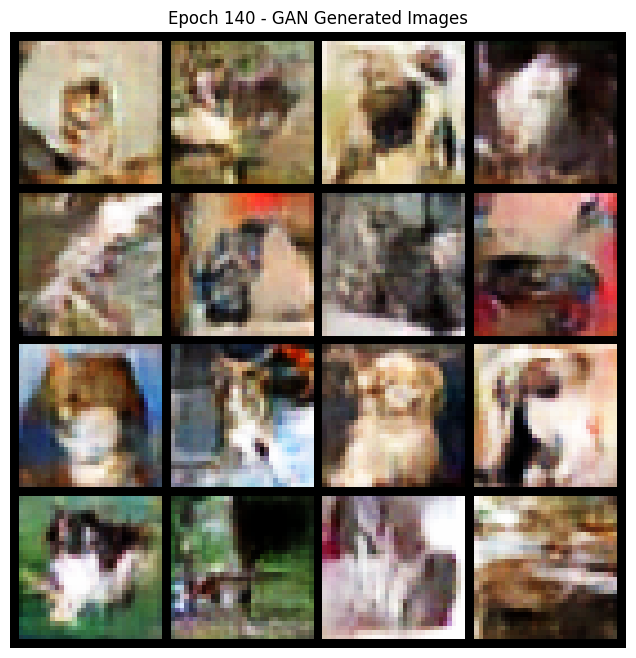

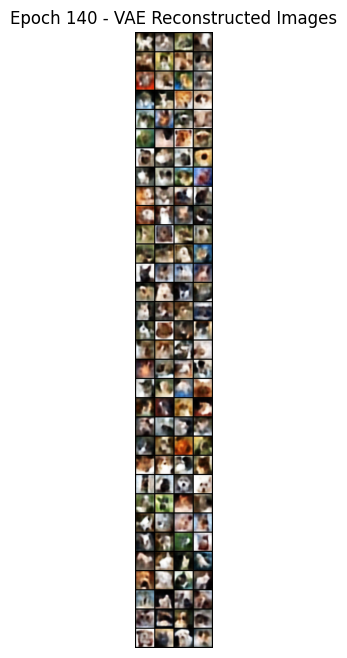

 35% (140 of 400) |#######               | Elapsed Time: 0:38:11 ETA:   1:10:55

Epoch [141/400] - GAN D Loss: -2.4391, G Loss: -0.0073, VAE Loss: 22990.2012


 35% (141 of 400) |#######               | Elapsed Time: 0:38:27 ETA:   1:10:39

Epoch [142/400] - GAN D Loss: -2.3555, G Loss: 0.0068, VAE Loss: 22978.9613


 35% (142 of 400) |#######               | Elapsed Time: 0:38:44 ETA:   1:10:22

Epoch [143/400] - GAN D Loss: -2.3461, G Loss: 0.3293, VAE Loss: 22952.9894


 35% (143 of 400) |#######               | Elapsed Time: 0:39:00 ETA:   1:10:06

Epoch [144/400] - GAN D Loss: -2.2497, G Loss: -0.0164, VAE Loss: 22933.4259


 36% (144 of 400) |#######               | Elapsed Time: 0:39:16 ETA:   1:09:49

Epoch [145/400] - GAN D Loss: -2.2525, G Loss: 0.3156, VAE Loss: 22950.8707


 36% (145 of 400) |#######               | Elapsed Time: 0:39:33 ETA:   1:09:33

Epoch [146/400] - GAN D Loss: -2.5328, G Loss: 0.0358, VAE Loss: 22909.5903


 36% (146 of 400) |########              | Elapsed Time: 0:39:49 ETA:   1:09:17

Epoch [147/400] - GAN D Loss: -2.2412, G Loss: 0.3783, VAE Loss: 22910.4850


 36% (147 of 400) |########              | Elapsed Time: 0:40:05 ETA:   1:09:00

Epoch [148/400] - GAN D Loss: -2.4154, G Loss: 0.2813, VAE Loss: 22908.0732


 37% (148 of 400) |########              | Elapsed Time: 0:40:22 ETA:   1:08:44

Epoch [149/400] - GAN D Loss: -2.5311, G Loss: 0.3196, VAE Loss: 22929.3733


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [150/400] - GAN D Loss: -2.3679, G Loss: 0.5539, VAE Loss: 22878.7252


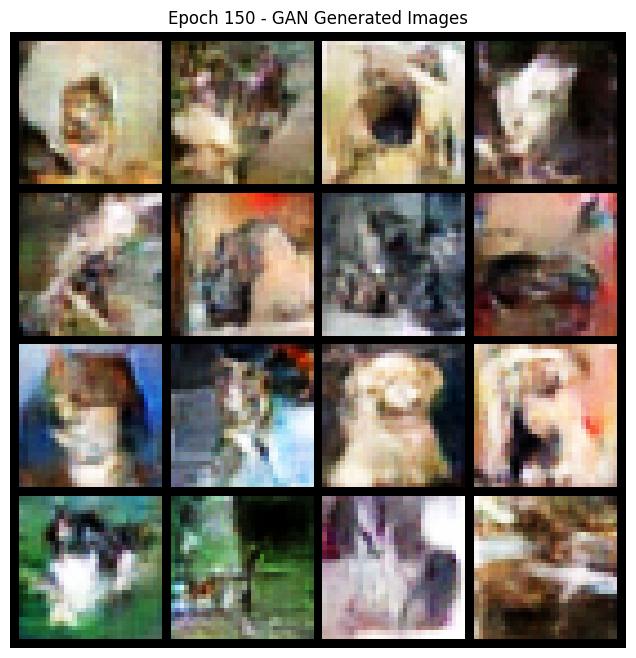

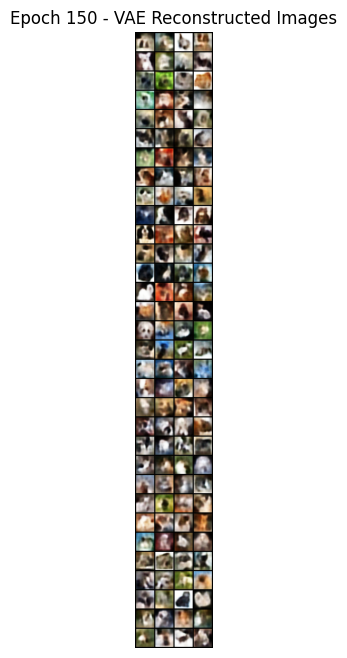

 37% (150 of 400) |########              | Elapsed Time: 0:40:55 ETA:   1:08:12

Epoch [151/400] - GAN D Loss: -1.8235, G Loss: 0.2302, VAE Loss: 22892.7550


 37% (151 of 400) |########              | Elapsed Time: 0:41:11 ETA:   1:07:55

Epoch [152/400] - GAN D Loss: -2.5420, G Loss: 0.1927, VAE Loss: 22904.0551


 38% (152 of 400) |########              | Elapsed Time: 0:41:27 ETA:   1:07:39

Epoch [153/400] - GAN D Loss: -2.0398, G Loss: 0.4292, VAE Loss: 22864.9149


 38% (153 of 400) |########              | Elapsed Time: 0:41:44 ETA:   1:07:22

Epoch [154/400] - GAN D Loss: -2.5896, G Loss: 0.1073, VAE Loss: 22851.8369


 38% (154 of 400) |########              | Elapsed Time: 0:42:00 ETA:   1:07:06

Epoch [155/400] - GAN D Loss: -2.6343, G Loss: 0.0365, VAE Loss: 22847.6051


 38% (155 of 400) |########              | Elapsed Time: 0:42:16 ETA:   1:06:49

Epoch [156/400] - GAN D Loss: -2.2715, G Loss: 0.0070, VAE Loss: 22841.2711


 39% (156 of 400) |########              | Elapsed Time: 0:42:33 ETA:   1:06:33

Epoch [157/400] - GAN D Loss: -2.4806, G Loss: 0.1084, VAE Loss: 22837.2092


 39% (157 of 400) |########              | Elapsed Time: 0:42:49 ETA:   1:06:16

Epoch [158/400] - GAN D Loss: -2.3137, G Loss: 0.1359, VAE Loss: 22795.1168


 39% (158 of 400) |########              | Elapsed Time: 0:43:05 ETA:   1:06:00

Epoch [159/400] - GAN D Loss: -2.4484, G Loss: 0.2437, VAE Loss: 22782.9047


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [160/400] - GAN D Loss: -2.4297, G Loss: 0.3264, VAE Loss: 22817.9910


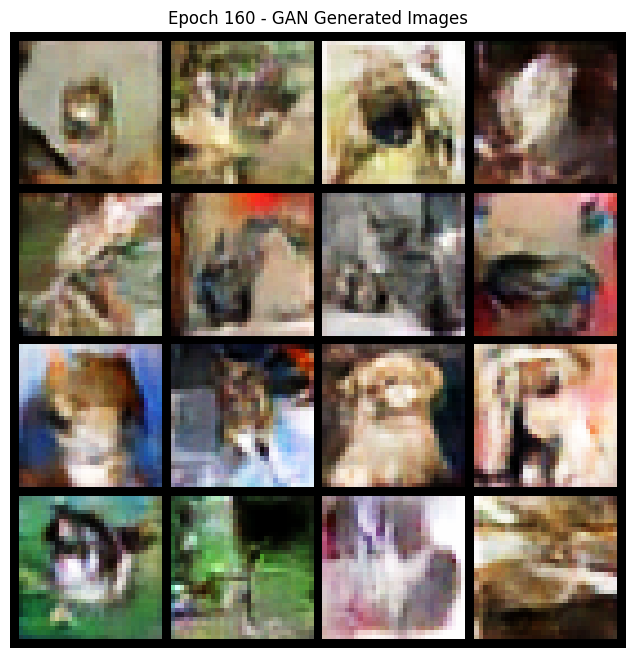

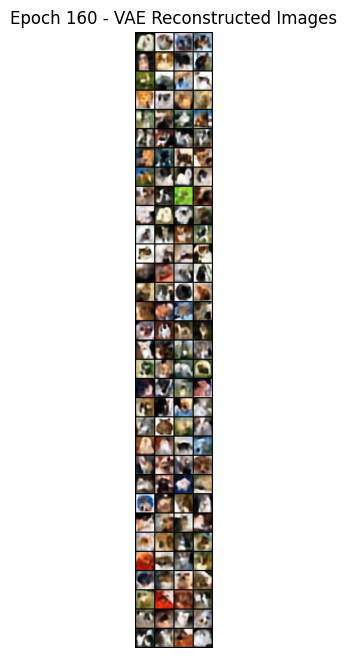

 40% (160 of 400) |########              | Elapsed Time: 0:43:38 ETA:   1:05:28

Epoch [161/400] - GAN D Loss: -2.6309, G Loss: -0.1062, VAE Loss: 22744.8802


 40% (161 of 400) |########              | Elapsed Time: 0:43:55 ETA:   1:05:11

Epoch [162/400] - GAN D Loss: -2.7005, G Loss: 0.3835, VAE Loss: 22751.0066


 40% (162 of 400) |########              | Elapsed Time: 0:44:11 ETA:   1:04:55

Epoch [163/400] - GAN D Loss: -2.5999, G Loss: 0.2679, VAE Loss: 22747.1611


 40% (163 of 400) |########              | Elapsed Time: 0:44:27 ETA:   1:04:38

Epoch [164/400] - GAN D Loss: -2.7118, G Loss: -0.2557, VAE Loss: 22735.8496


 41% (164 of 400) |#########             | Elapsed Time: 0:44:44 ETA:   1:04:22

Epoch [165/400] - GAN D Loss: -2.2070, G Loss: 0.0921, VAE Loss: 22759.6710


 41% (165 of 400) |#########             | Elapsed Time: 0:45:00 ETA:   1:04:05

Epoch [166/400] - GAN D Loss: -2.6139, G Loss: 0.0063, VAE Loss: 22714.0296


 41% (166 of 400) |#########             | Elapsed Time: 0:45:16 ETA:   1:03:49

Epoch [167/400] - GAN D Loss: -2.9514, G Loss: 0.0763, VAE Loss: 22710.6077


 41% (167 of 400) |#########             | Elapsed Time: 0:45:32 ETA:   1:03:33

Epoch [168/400] - GAN D Loss: -2.5961, G Loss: 0.1233, VAE Loss: 22725.8146


 42% (168 of 400) |#########             | Elapsed Time: 0:45:49 ETA:   1:03:16

Epoch [169/400] - GAN D Loss: -3.0941, G Loss: 0.1086, VAE Loss: 22714.0932


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [170/400] - GAN D Loss: -2.7794, G Loss: 0.2851, VAE Loss: 22712.8011


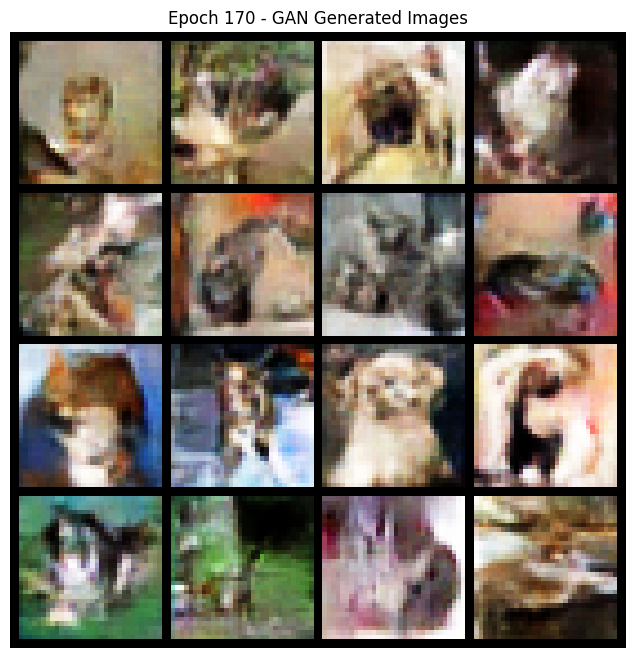

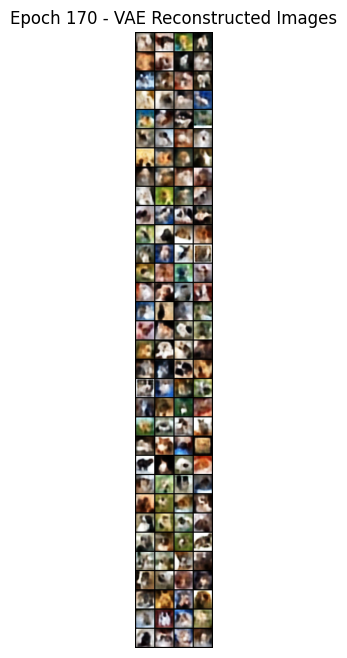

 42% (170 of 400) |#########             | Elapsed Time: 0:46:22 ETA:   1:02:44

Epoch [171/400] - GAN D Loss: -2.5158, G Loss: 0.2495, VAE Loss: 22713.7003


 42% (171 of 400) |#########             | Elapsed Time: 0:46:38 ETA:   1:02:27

Epoch [172/400] - GAN D Loss: -2.7776, G Loss: 0.6644, VAE Loss: 22686.7437


 43% (172 of 400) |#########             | Elapsed Time: 0:46:54 ETA:   1:02:11

Epoch [173/400] - GAN D Loss: -3.3009, G Loss: 0.0918, VAE Loss: 22665.9493


 43% (173 of 400) |#########             | Elapsed Time: 0:47:11 ETA:   1:01:54

Epoch [174/400] - GAN D Loss: -2.9635, G Loss: -0.0471, VAE Loss: 22723.8550


 43% (174 of 400) |#########             | Elapsed Time: 0:47:27 ETA:   1:01:38

Epoch [175/400] - GAN D Loss: -2.7860, G Loss: 0.1704, VAE Loss: 22645.7751


 43% (175 of 400) |#########             | Elapsed Time: 0:47:43 ETA:   1:01:22

Epoch [176/400] - GAN D Loss: -2.4173, G Loss: 0.1976, VAE Loss: 22620.8802


 44% (176 of 400) |#########             | Elapsed Time: 0:48:00 ETA:   1:01:05

Epoch [177/400] - GAN D Loss: -3.1401, G Loss: 0.0126, VAE Loss: 22687.4210


 44% (177 of 400) |#########             | Elapsed Time: 0:48:16 ETA:   1:00:49

Epoch [178/400] - GAN D Loss: -2.6087, G Loss: -0.1067, VAE Loss: 22637.6317


 44% (178 of 400) |#########             | Elapsed Time: 0:48:32 ETA:   1:00:32

Epoch [179/400] - GAN D Loss: -3.0725, G Loss: 0.2970, VAE Loss: 22629.2698


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [180/400] - GAN D Loss: -3.4659, G Loss: -0.1401, VAE Loss: 22655.2062


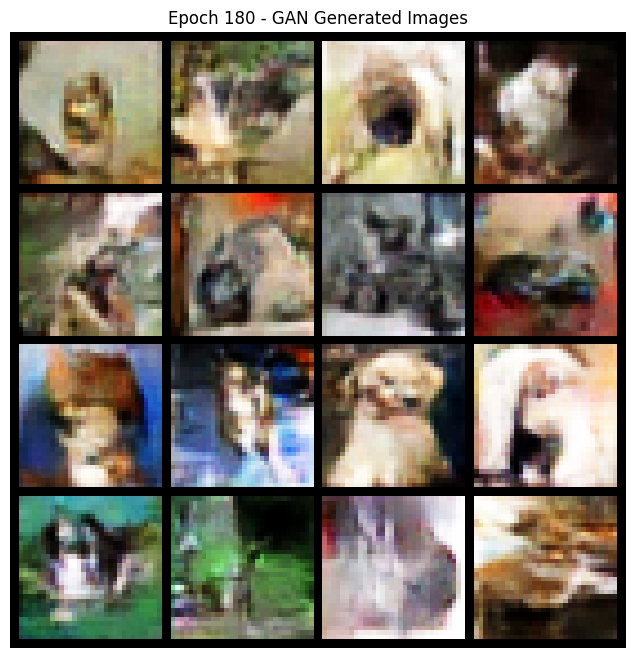

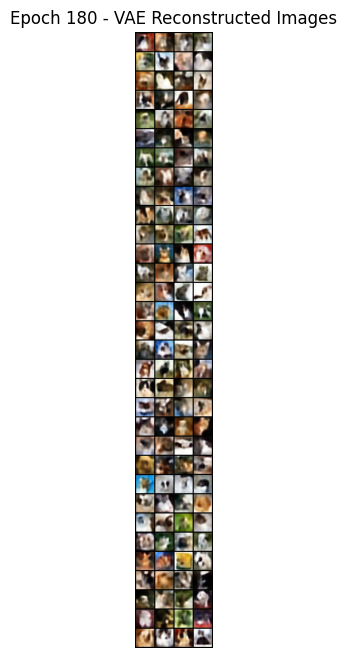

 45% (180 of 400) |#########             | Elapsed Time: 0:49:05 ETA:   1:00:00

Epoch [181/400] - GAN D Loss: -2.8835, G Loss: 0.2843, VAE Loss: 22630.7528


 45% (181 of 400) |#########             | Elapsed Time: 0:49:22 ETA:   0:59:43

Epoch [182/400] - GAN D Loss: -3.5510, G Loss: -0.2179, VAE Loss: 22617.1720


 45% (182 of 400) |##########            | Elapsed Time: 0:49:38 ETA:   0:59:27

Epoch [183/400] - GAN D Loss: -3.5411, G Loss: 0.1889, VAE Loss: 22578.5919


 45% (183 of 400) |##########            | Elapsed Time: 0:49:54 ETA:   0:59:10

Epoch [184/400] - GAN D Loss: -1.9257, G Loss: -0.1130, VAE Loss: 22585.3405


 46% (184 of 400) |##########            | Elapsed Time: 0:50:10 ETA:   0:58:54

Epoch [185/400] - GAN D Loss: -3.5297, G Loss: -0.1046, VAE Loss: 22561.9659


 46% (185 of 400) |##########            | Elapsed Time: 0:50:27 ETA:   0:58:38

Epoch [186/400] - GAN D Loss: -3.6177, G Loss: 0.1142, VAE Loss: 22586.0576


 46% (186 of 400) |##########            | Elapsed Time: 0:50:43 ETA:   0:58:21

Epoch [187/400] - GAN D Loss: -3.7360, G Loss: 0.4864, VAE Loss: 22584.7274


 46% (187 of 400) |##########            | Elapsed Time: 0:50:59 ETA:   0:58:05

Epoch [188/400] - GAN D Loss: -3.3349, G Loss: 0.2342, VAE Loss: 22557.7991


 47% (188 of 400) |##########            | Elapsed Time: 0:51:16 ETA:   0:57:48

Epoch [189/400] - GAN D Loss: -3.6867, G Loss: 0.5180, VAE Loss: 22610.7195


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [190/400] - GAN D Loss: -2.7191, G Loss: 0.7544, VAE Loss: 22554.9746


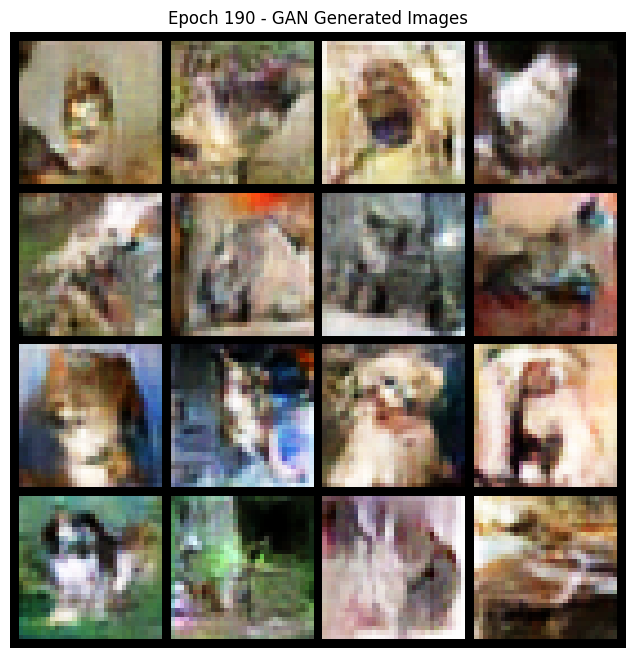

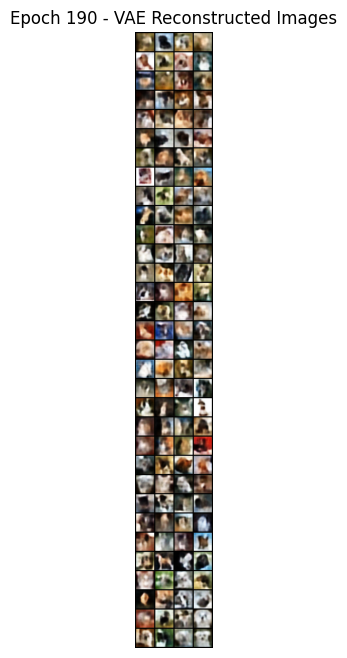

 47% (190 of 400) |##########            | Elapsed Time: 0:51:49 ETA:   0:57:16

Epoch [191/400] - GAN D Loss: -3.4100, G Loss: -0.2668, VAE Loss: 22591.4119


 47% (191 of 400) |##########            | Elapsed Time: 0:52:05 ETA:   0:57:00

Epoch [192/400] - GAN D Loss: -3.5940, G Loss: 0.4741, VAE Loss: 22529.5167


 48% (192 of 400) |##########            | Elapsed Time: 0:52:21 ETA:   0:56:43

Epoch [193/400] - GAN D Loss: -3.2247, G Loss: 0.2076, VAE Loss: 22523.7233


 48% (193 of 400) |##########            | Elapsed Time: 0:52:38 ETA:   0:56:27

Epoch [194/400] - GAN D Loss: -3.9348, G Loss: 0.5359, VAE Loss: 22523.6938


 48% (194 of 400) |##########            | Elapsed Time: 0:52:54 ETA:   0:56:10

Epoch [195/400] - GAN D Loss: -3.6801, G Loss: 0.0518, VAE Loss: 22523.4711


 48% (195 of 400) |##########            | Elapsed Time: 0:53:10 ETA:   0:55:54

Epoch [196/400] - GAN D Loss: -3.7465, G Loss: 0.3998, VAE Loss: 22520.3699


 49% (196 of 400) |##########            | Elapsed Time: 0:53:27 ETA:   0:55:38

Epoch [197/400] - GAN D Loss: -3.5090, G Loss: 0.6992, VAE Loss: 22497.5828


 49% (197 of 400) |##########            | Elapsed Time: 0:53:43 ETA:   0:55:21

Epoch [198/400] - GAN D Loss: -3.6408, G Loss: 0.5215, VAE Loss: 22488.8599


 49% (198 of 400) |##########            | Elapsed Time: 0:53:59 ETA:   0:55:05

Epoch [199/400] - GAN D Loss: -3.2665, G Loss: -0.0417, VAE Loss: 22487.2747


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [200/400] - GAN D Loss: -3.1652, G Loss: 0.8037, VAE Loss: 22461.8850


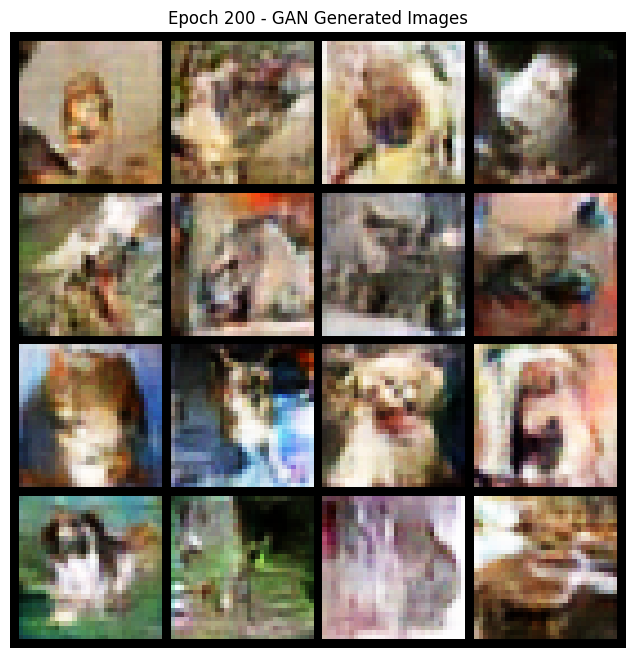

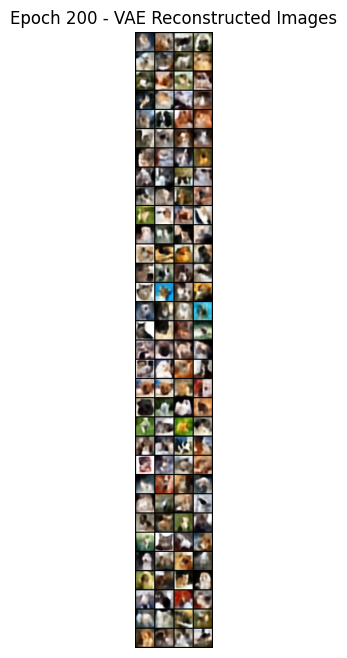

 50% (200 of 400) |###########           | Elapsed Time: 0:54:32 ETA:   0:54:32

Epoch [201/400] - GAN D Loss: -3.6532, G Loss: 0.7168, VAE Loss: 22467.9365


 50% (201 of 400) |###########           | Elapsed Time: 0:54:49 ETA:   0:54:16

Epoch [202/400] - GAN D Loss: -3.3142, G Loss: 0.0812, VAE Loss: 22463.5769


 50% (202 of 400) |###########           | Elapsed Time: 0:55:05 ETA:   0:54:00

Epoch [203/400] - GAN D Loss: -4.2754, G Loss: 0.6597, VAE Loss: 22487.2658


 50% (203 of 400) |###########           | Elapsed Time: 0:55:21 ETA:   0:53:43

Epoch [204/400] - GAN D Loss: -3.5209, G Loss: 0.4553, VAE Loss: 22474.6882


 51% (204 of 400) |###########           | Elapsed Time: 0:55:38 ETA:   0:53:27

Epoch [205/400] - GAN D Loss: -3.6670, G Loss: 0.5890, VAE Loss: 22450.8820


 51% (205 of 400) |###########           | Elapsed Time: 0:55:54 ETA:   0:53:10

Epoch [206/400] - GAN D Loss: -2.3881, G Loss: 0.5506, VAE Loss: 22444.1612


 51% (206 of 400) |###########           | Elapsed Time: 0:56:10 ETA:   0:52:54

Epoch [207/400] - GAN D Loss: -4.8164, G Loss: 0.9435, VAE Loss: 22454.9794


 51% (207 of 400) |###########           | Elapsed Time: 0:56:27 ETA:   0:52:38

Epoch [208/400] - GAN D Loss: -4.1962, G Loss: 0.7107, VAE Loss: 22418.7007


 52% (208 of 400) |###########           | Elapsed Time: 0:56:43 ETA:   0:52:21

Epoch [209/400] - GAN D Loss: -1.9530, G Loss: 0.7381, VAE Loss: 22447.9478


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [210/400] - GAN D Loss: -5.5771, G Loss: 0.2374, VAE Loss: 22438.1905


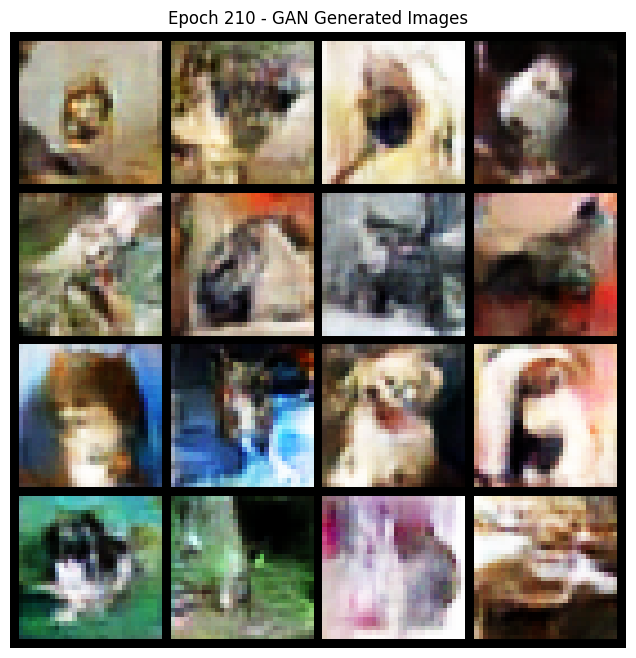

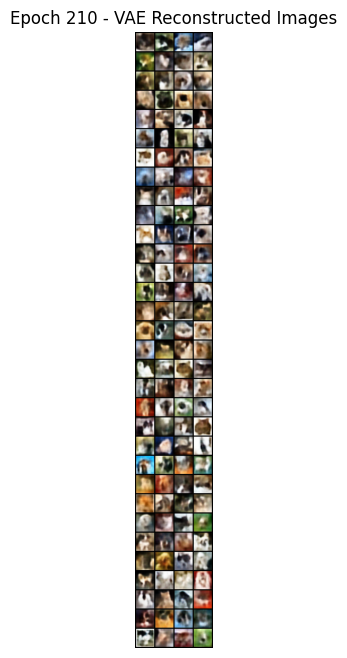

 52% (210 of 400) |###########           | Elapsed Time: 0:57:16 ETA:   0:51:49

Epoch [211/400] - GAN D Loss: -5.6236, G Loss: 1.3749, VAE Loss: 22435.4984


 52% (211 of 400) |###########           | Elapsed Time: 0:57:32 ETA:   0:51:32

Epoch [212/400] - GAN D Loss: -4.4275, G Loss: 1.3696, VAE Loss: 22425.9590


 53% (212 of 400) |###########           | Elapsed Time: 0:57:49 ETA:   0:51:16

Epoch [213/400] - GAN D Loss: -4.3499, G Loss: 0.7974, VAE Loss: 22397.8349


 53% (213 of 400) |###########           | Elapsed Time: 0:58:05 ETA:   0:51:00

Epoch [214/400] - GAN D Loss: -4.6249, G Loss: 1.2105, VAE Loss: 22425.9379


 53% (214 of 400) |###########           | Elapsed Time: 0:58:21 ETA:   0:50:43

Epoch [215/400] - GAN D Loss: -4.7884, G Loss: 1.0269, VAE Loss: 22380.5461


 53% (215 of 400) |###########           | Elapsed Time: 0:58:38 ETA:   0:50:27

Epoch [216/400] - GAN D Loss: -4.9521, G Loss: 0.8303, VAE Loss: 22411.2736


 54% (216 of 400) |###########           | Elapsed Time: 0:58:54 ETA:   0:50:10

Epoch [217/400] - GAN D Loss: -4.2800, G Loss: 0.6895, VAE Loss: 22369.9168


 54% (217 of 400) |###########           | Elapsed Time: 0:59:10 ETA:   0:49:54

Epoch [218/400] - GAN D Loss: -6.1477, G Loss: 0.7226, VAE Loss: 22380.7900


 54% (218 of 400) |###########           | Elapsed Time: 0:59:27 ETA:   0:49:38

Epoch [219/400] - GAN D Loss: -3.8907, G Loss: 0.7461, VAE Loss: 22374.8227


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [220/400] - GAN D Loss: -4.7511, G Loss: 0.9833, VAE Loss: 22368.7569


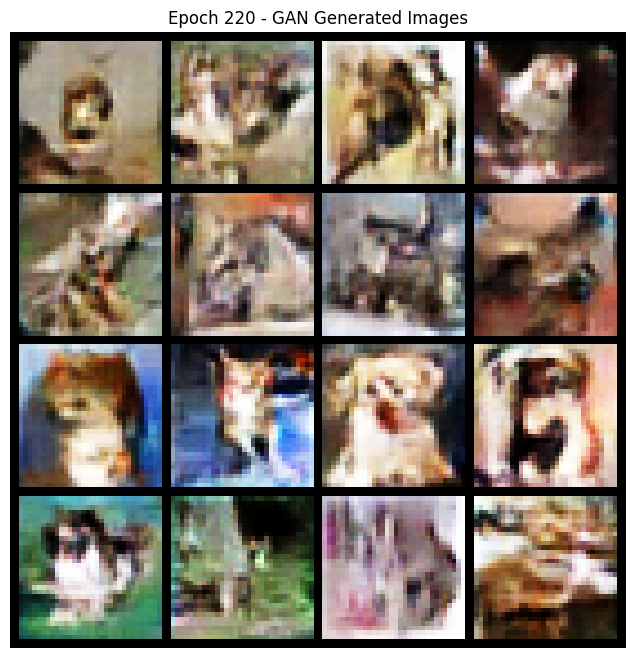

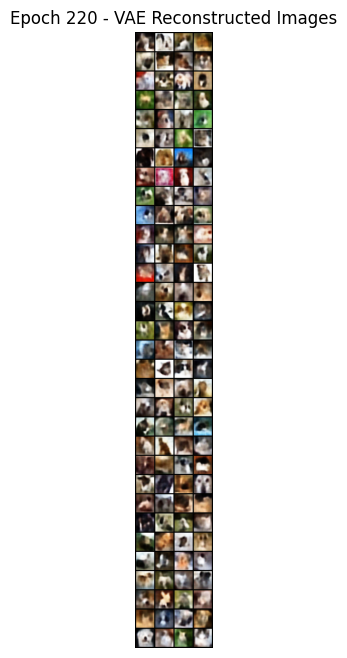

 55% (220 of 400) |############          | Elapsed Time: 1:00:00 ETA:   0:49:05

Epoch [221/400] - GAN D Loss: -3.5428, G Loss: 0.9785, VAE Loss: 22346.3530


 55% (221 of 400) |############          | Elapsed Time: 1:00:16 ETA:   0:48:49

Epoch [222/400] - GAN D Loss: -4.0404, G Loss: 0.9862, VAE Loss: 22359.2322


 55% (222 of 400) |############          | Elapsed Time: 1:00:32 ETA:   0:48:32

Epoch [223/400] - GAN D Loss: -6.5630, G Loss: 1.2972, VAE Loss: 22352.0105


 55% (223 of 400) |############          | Elapsed Time: 1:00:48 ETA:   0:48:16

Epoch [224/400] - GAN D Loss: -4.8061, G Loss: 1.3916, VAE Loss: 22322.1354


 56% (224 of 400) |############          | Elapsed Time: 1:01:05 ETA:   0:47:59

Epoch [225/400] - GAN D Loss: -4.9692, G Loss: 1.2554, VAE Loss: 22409.3677


 56% (225 of 400) |############          | Elapsed Time: 1:01:21 ETA:   0:47:43

Epoch [226/400] - GAN D Loss: -5.2209, G Loss: 1.0352, VAE Loss: 22353.7642


 56% (226 of 400) |############          | Elapsed Time: 1:01:37 ETA:   0:47:27

Epoch [227/400] - GAN D Loss: -6.2863, G Loss: 1.1772, VAE Loss: 22318.7104


 56% (227 of 400) |############          | Elapsed Time: 1:01:54 ETA:   0:47:10

Epoch [228/400] - GAN D Loss: -5.2666, G Loss: 1.3982, VAE Loss: 22294.3242


 57% (228 of 400) |############          | Elapsed Time: 1:02:10 ETA:   0:46:54

Epoch [229/400] - GAN D Loss: -6.8862, G Loss: 2.0222, VAE Loss: 22276.5292


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [230/400] - GAN D Loss: -6.2759, G Loss: 1.9682, VAE Loss: 22301.4810


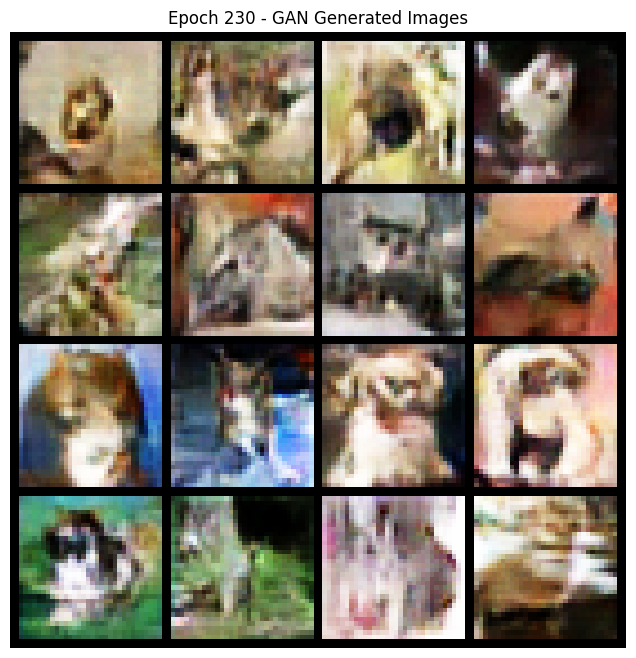

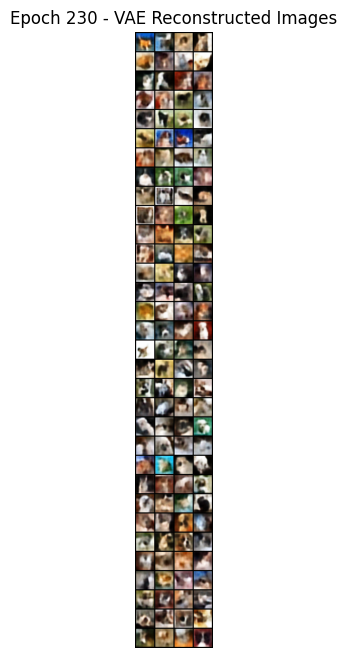

 57% (230 of 400) |############          | Elapsed Time: 1:02:43 ETA:   0:46:21

Epoch [231/400] - GAN D Loss: -7.1623, G Loss: 1.5186, VAE Loss: 22318.8517


 57% (231 of 400) |############          | Elapsed Time: 1:02:59 ETA:   0:46:05

Epoch [232/400] - GAN D Loss: -4.4564, G Loss: 1.7046, VAE Loss: 22292.4266


 58% (232 of 400) |############          | Elapsed Time: 1:03:16 ETA:   0:45:48

Epoch [233/400] - GAN D Loss: -5.1393, G Loss: 1.7751, VAE Loss: 22266.1615


 58% (233 of 400) |############          | Elapsed Time: 1:03:32 ETA:   0:45:32

Epoch [234/400] - GAN D Loss: -6.4359, G Loss: 2.2647, VAE Loss: 22291.6155


 58% (234 of 400) |############          | Elapsed Time: 1:03:48 ETA:   0:45:16

Epoch [235/400] - GAN D Loss: -5.1606, G Loss: 1.7989, VAE Loss: 22262.5523


 58% (235 of 400) |############          | Elapsed Time: 1:04:04 ETA:   0:44:59

Epoch [236/400] - GAN D Loss: -7.7969, G Loss: 2.7328, VAE Loss: 22278.9604


 59% (236 of 400) |############          | Elapsed Time: 1:04:21 ETA:   0:44:43

Epoch [237/400] - GAN D Loss: -4.6802, G Loss: 2.3254, VAE Loss: 22293.6399


 59% (237 of 400) |#############         | Elapsed Time: 1:04:37 ETA:   0:44:26

Epoch [238/400] - GAN D Loss: -6.1235, G Loss: 1.8040, VAE Loss: 22265.1193


 59% (238 of 400) |#############         | Elapsed Time: 1:04:54 ETA:   0:44:10

Epoch [239/400] - GAN D Loss: -5.6113, G Loss: 2.4908, VAE Loss: 22244.1727


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [240/400] - GAN D Loss: -5.3020, G Loss: 1.9874, VAE Loss: 22240.6430


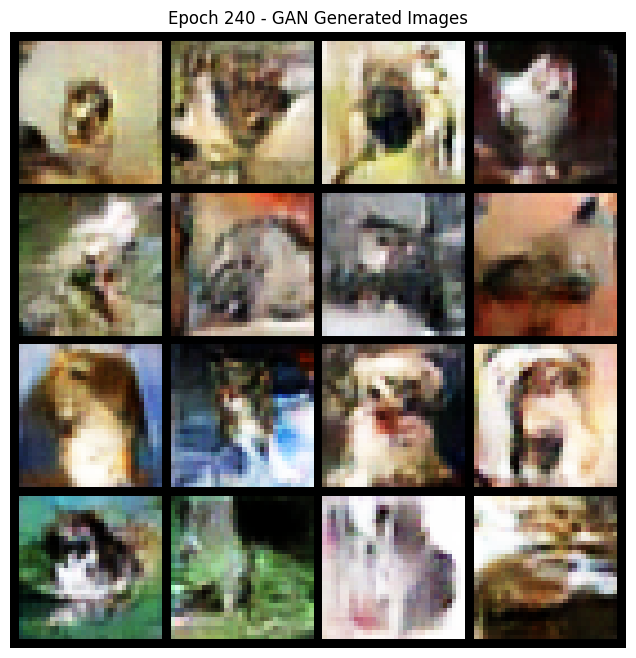

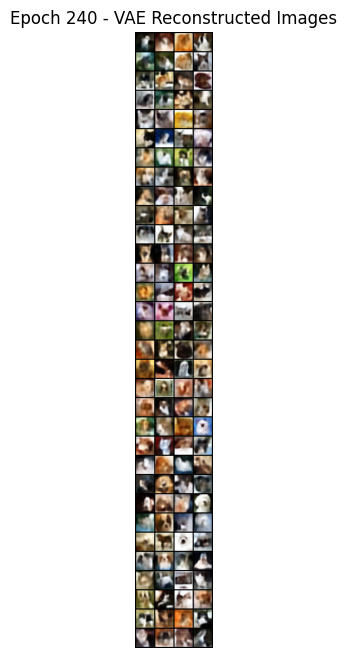

 60% (240 of 400) |#############         | Elapsed Time: 1:05:27 ETA:   0:43:38

Epoch [241/400] - GAN D Loss: -5.1064, G Loss: 2.0890, VAE Loss: 22258.7789


 60% (241 of 400) |#############         | Elapsed Time: 1:05:43 ETA:   0:43:21

Epoch [242/400] - GAN D Loss: -5.3859, G Loss: 2.2138, VAE Loss: 22232.6814


 60% (242 of 400) |#############         | Elapsed Time: 1:05:59 ETA:   0:43:05

Epoch [243/400] - GAN D Loss: -5.4689, G Loss: 1.9369, VAE Loss: 22257.4265


 60% (243 of 400) |#############         | Elapsed Time: 1:06:16 ETA:   0:42:48

Epoch [244/400] - GAN D Loss: -7.2232, G Loss: 1.9685, VAE Loss: 22223.1384


 61% (244 of 400) |#############         | Elapsed Time: 1:06:32 ETA:   0:42:32

Epoch [245/400] - GAN D Loss: -8.2061, G Loss: 2.7080, VAE Loss: 22216.3289


 61% (245 of 400) |#############         | Elapsed Time: 1:06:48 ETA:   0:42:16

Epoch [246/400] - GAN D Loss: -6.9473, G Loss: 2.3197, VAE Loss: 22206.0925


 61% (246 of 400) |#############         | Elapsed Time: 1:07:05 ETA:   0:41:59

Epoch [247/400] - GAN D Loss: -9.0615, G Loss: 1.8869, VAE Loss: 22235.7050


 61% (247 of 400) |#############         | Elapsed Time: 1:07:21 ETA:   0:41:43

Epoch [248/400] - GAN D Loss: -7.5489, G Loss: 1.7578, VAE Loss: 22226.6665


 62% (248 of 400) |#############         | Elapsed Time: 1:07:37 ETA:   0:41:26

Epoch [249/400] - GAN D Loss: -10.3640, G Loss: 3.4218, VAE Loss: 22197.0228


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [250/400] - GAN D Loss: -7.1617, G Loss: 3.2074, VAE Loss: 22187.3155


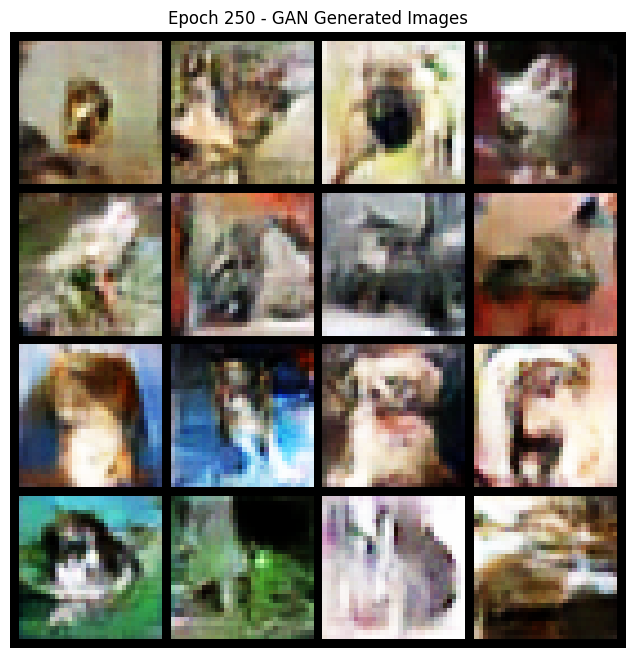

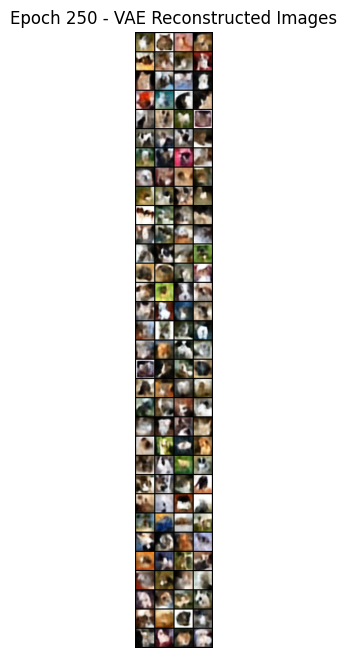

 62% (250 of 400) |#############         | Elapsed Time: 1:08:10 ETA:   0:40:54

Epoch [251/400] - GAN D Loss: -6.1856, G Loss: 2.3440, VAE Loss: 22230.4292


 62% (251 of 400) |#############         | Elapsed Time: 1:08:27 ETA:   0:40:38

Epoch [252/400] - GAN D Loss: -8.4680, G Loss: 3.1993, VAE Loss: 22186.7272


 63% (252 of 400) |#############         | Elapsed Time: 1:08:43 ETA:   0:40:21

Epoch [253/400] - GAN D Loss: -4.4414, G Loss: 2.0601, VAE Loss: 22165.9680


 63% (253 of 400) |#############         | Elapsed Time: 1:08:59 ETA:   0:40:05

Epoch [254/400] - GAN D Loss: -4.7457, G Loss: 2.5856, VAE Loss: 22201.3848


 63% (254 of 400) |#############         | Elapsed Time: 1:09:16 ETA:   0:39:49

Epoch [255/400] - GAN D Loss: -7.8308, G Loss: 2.3665, VAE Loss: 22180.1860


 63% (255 of 400) |##############        | Elapsed Time: 1:09:32 ETA:   0:39:32

Epoch [256/400] - GAN D Loss: 0.7960, G Loss: 2.7720, VAE Loss: 22176.2113


 64% (256 of 400) |##############        | Elapsed Time: 1:09:48 ETA:   0:39:16

Epoch [257/400] - GAN D Loss: -5.4206, G Loss: 2.2980, VAE Loss: 22154.8875


 64% (257 of 400) |##############        | Elapsed Time: 1:10:05 ETA:   0:38:59

Epoch [258/400] - GAN D Loss: -9.4896, G Loss: 2.3148, VAE Loss: 22173.6779


 64% (258 of 400) |##############        | Elapsed Time: 1:10:21 ETA:   0:38:43

Epoch [259/400] - GAN D Loss: -8.6750, G Loss: 3.9339, VAE Loss: 22156.9662


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [260/400] - GAN D Loss: -3.5868, G Loss: 2.7328, VAE Loss: 22189.4232


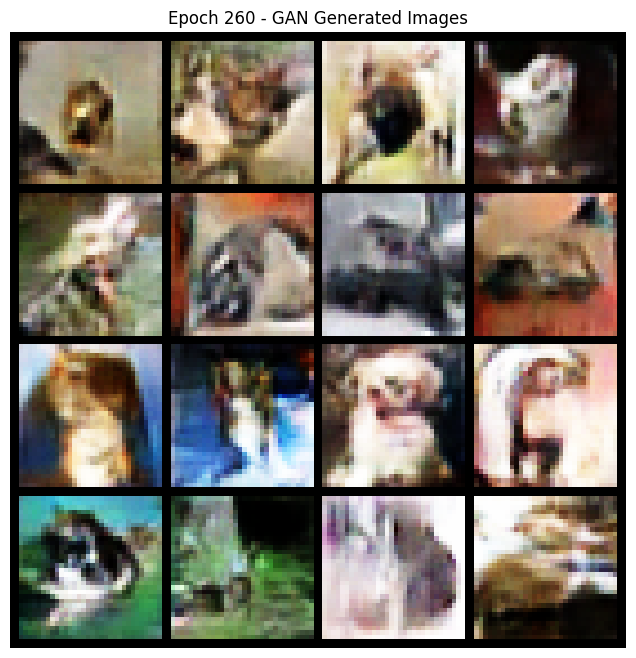

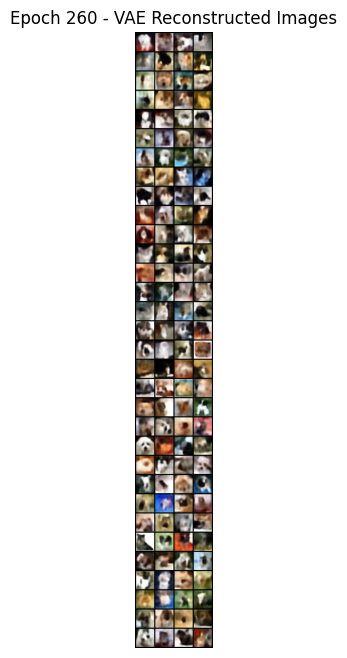

 65% (260 of 400) |##############        | Elapsed Time: 1:10:54 ETA:   0:38:10

Epoch [261/400] - GAN D Loss: -4.6694, G Loss: 2.5784, VAE Loss: 22150.1026


 65% (261 of 400) |##############        | Elapsed Time: 1:11:10 ETA:   0:37:54

Epoch [262/400] - GAN D Loss: -7.5470, G Loss: 2.9364, VAE Loss: 22175.4546


 65% (262 of 400) |##############        | Elapsed Time: 1:11:27 ETA:   0:37:38

Epoch [263/400] - GAN D Loss: -3.3126, G Loss: 2.9525, VAE Loss: 22179.2851


 65% (263 of 400) |##############        | Elapsed Time: 1:11:43 ETA:   0:37:21

Epoch [264/400] - GAN D Loss: -9.0852, G Loss: 3.4629, VAE Loss: 22185.6817


 66% (264 of 400) |##############        | Elapsed Time: 1:11:59 ETA:   0:37:05

Epoch [265/400] - GAN D Loss: -7.6753, G Loss: 3.2131, VAE Loss: 22100.5578


 66% (265 of 400) |##############        | Elapsed Time: 1:12:16 ETA:   0:36:49

Epoch [266/400] - GAN D Loss: -5.5281, G Loss: 2.5585, VAE Loss: 22098.5134


 66% (266 of 400) |##############        | Elapsed Time: 1:12:32 ETA:   0:36:32

Epoch [267/400] - GAN D Loss: -4.9206, G Loss: 2.7816, VAE Loss: 22130.5865


 66% (267 of 400) |##############        | Elapsed Time: 1:12:49 ETA:   0:36:16

Epoch [268/400] - GAN D Loss: -5.6611, G Loss: 2.5040, VAE Loss: 22087.1662


 67% (268 of 400) |##############        | Elapsed Time: 1:13:05 ETA:   0:35:59

Epoch [269/400] - GAN D Loss: -3.0759, G Loss: 2.9208, VAE Loss: 22118.4588


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [270/400] - GAN D Loss: -8.9370, G Loss: 2.9034, VAE Loss: 22098.1889


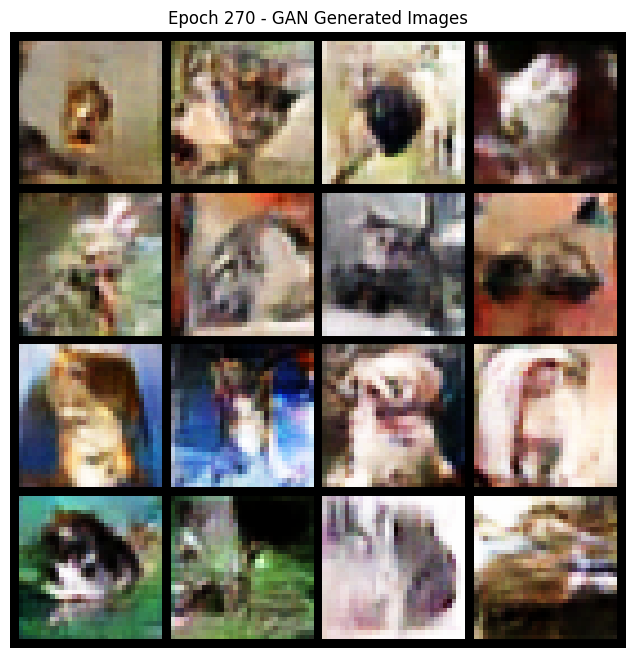

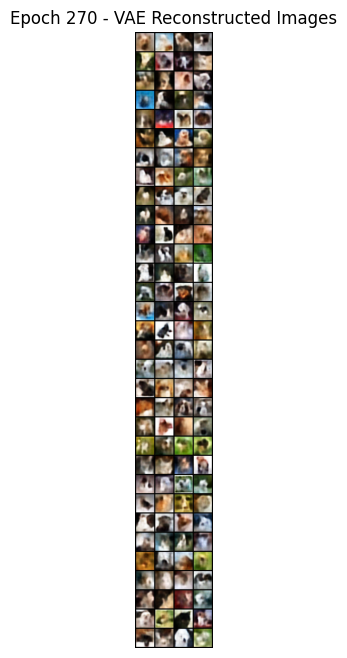

 67% (270 of 400) |##############        | Elapsed Time: 1:13:38 ETA:   0:35:27

Epoch [271/400] - GAN D Loss: -9.0088, G Loss: 4.2880, VAE Loss: 22100.2339


 67% (271 of 400) |##############        | Elapsed Time: 1:13:54 ETA:   0:35:11

Epoch [272/400] - GAN D Loss: -4.3000, G Loss: 3.2813, VAE Loss: 22120.5850


 68% (272 of 400) |##############        | Elapsed Time: 1:14:11 ETA:   0:34:54

Epoch [273/400] - GAN D Loss: -5.5539, G Loss: 2.9076, VAE Loss: 22078.7626


 68% (273 of 400) |###############       | Elapsed Time: 1:14:27 ETA:   0:34:38

Epoch [274/400] - GAN D Loss: -4.5307, G Loss: 3.2484, VAE Loss: 22073.3220


 68% (274 of 400) |###############       | Elapsed Time: 1:14:43 ETA:   0:34:21

Epoch [275/400] - GAN D Loss: -8.1915, G Loss: 2.9506, VAE Loss: 22094.3751


 68% (275 of 400) |###############       | Elapsed Time: 1:15:00 ETA:   0:34:05

Epoch [276/400] - GAN D Loss: 17.2842, G Loss: 4.3620, VAE Loss: 22083.9076


 69% (276 of 400) |###############       | Elapsed Time: 1:15:16 ETA:   0:33:49

Epoch [277/400] - GAN D Loss: -11.9349, G Loss: 2.9431, VAE Loss: 22093.9882


 69% (277 of 400) |###############       | Elapsed Time: 1:15:32 ETA:   0:33:32

Epoch [278/400] - GAN D Loss: -5.3125, G Loss: 4.2238, VAE Loss: 22067.9327


 69% (278 of 400) |###############       | Elapsed Time: 1:15:49 ETA:   0:33:16

Epoch [279/400] - GAN D Loss: -9.0783, G Loss: 3.7653, VAE Loss: 22033.8878


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [280/400] - GAN D Loss: -8.5112, G Loss: 4.3018, VAE Loss: 22070.5404


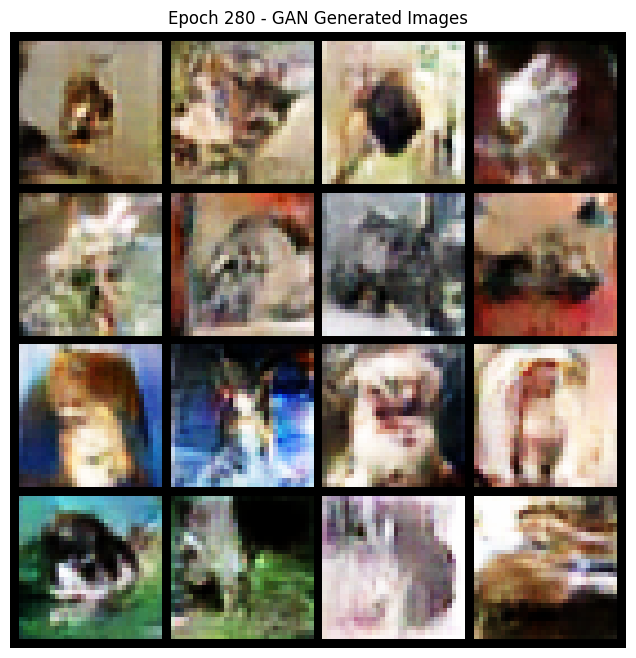

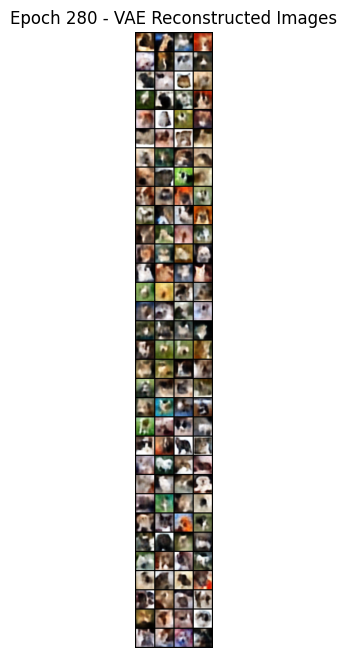

 70% (280 of 400) |###############       | Elapsed Time: 1:16:22 ETA:   0:32:43

Epoch [281/400] - GAN D Loss: -12.3561, G Loss: 3.6202, VAE Loss: 22067.8527


 70% (281 of 400) |###############       | Elapsed Time: 1:16:38 ETA:   0:32:27

Epoch [282/400] - GAN D Loss: -3.7821, G Loss: 4.4926, VAE Loss: 22057.6103


 70% (282 of 400) |###############       | Elapsed Time: 1:16:55 ETA:   0:32:11

Epoch [283/400] - GAN D Loss: -5.7145, G Loss: 3.7075, VAE Loss: 22056.8831


 70% (283 of 400) |###############       | Elapsed Time: 1:17:11 ETA:   0:31:54

Epoch [284/400] - GAN D Loss: -12.6976, G Loss: 3.6488, VAE Loss: 22076.0490


 71% (284 of 400) |###############       | Elapsed Time: 1:17:27 ETA:   0:31:38

Epoch [285/400] - GAN D Loss: -6.3450, G Loss: 4.6312, VAE Loss: 22039.9868


 71% (285 of 400) |###############       | Elapsed Time: 1:17:44 ETA:   0:31:21

Epoch [286/400] - GAN D Loss: -4.8012, G Loss: 4.1289, VAE Loss: 22059.0000


 71% (286 of 400) |###############       | Elapsed Time: 1:18:00 ETA:   0:31:05

Epoch [287/400] - GAN D Loss: -12.8478, G Loss: 4.7827, VAE Loss: 22024.0998


 71% (287 of 400) |###############       | Elapsed Time: 1:18:16 ETA:   0:30:49

Epoch [288/400] - GAN D Loss: -12.4247, G Loss: 4.2990, VAE Loss: 22054.6698


 72% (288 of 400) |###############       | Elapsed Time: 1:18:33 ETA:   0:30:32

Epoch [289/400] - GAN D Loss: -15.4302, G Loss: 4.6568, VAE Loss: 22027.6141


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [290/400] - GAN D Loss: -8.5831, G Loss: 4.8680, VAE Loss: 22049.9412


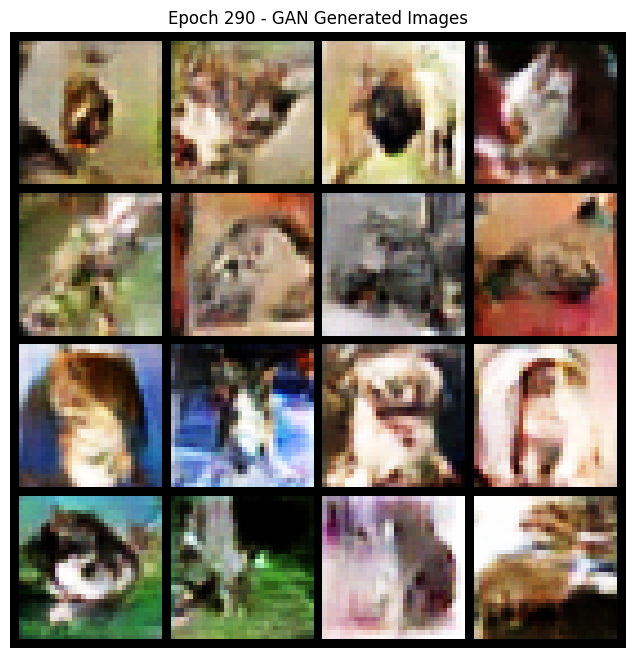

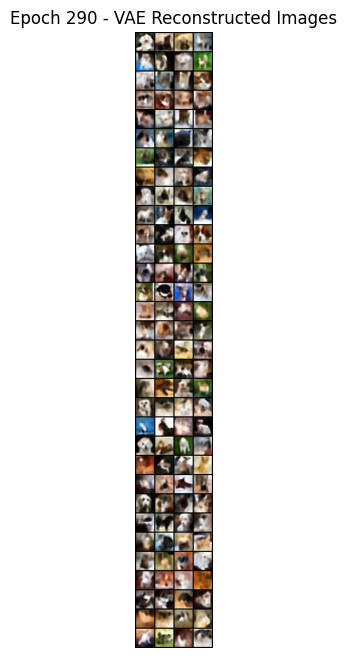

 72% (290 of 400) |###############       | Elapsed Time: 1:19:06 ETA:   0:30:00

Epoch [291/400] - GAN D Loss: -12.7972, G Loss: 3.3915, VAE Loss: 22022.1812


 72% (291 of 400) |################      | Elapsed Time: 1:19:22 ETA:   0:29:43

Epoch [292/400] - GAN D Loss: -15.8405, G Loss: 4.5615, VAE Loss: 22016.7367


 73% (292 of 400) |################      | Elapsed Time: 1:19:38 ETA:   0:29:27

Epoch [293/400] - GAN D Loss: -11.6839, G Loss: 5.7779, VAE Loss: 22047.7643


 73% (293 of 400) |################      | Elapsed Time: 1:19:55 ETA:   0:29:11

Epoch [294/400] - GAN D Loss: -7.0674, G Loss: 4.7627, VAE Loss: 22010.7630


 73% (294 of 400) |################      | Elapsed Time: 1:20:11 ETA:   0:28:54

Epoch [295/400] - GAN D Loss: -13.7275, G Loss: 6.9454, VAE Loss: 21989.9688


 73% (295 of 400) |################      | Elapsed Time: 1:20:27 ETA:   0:28:38

Epoch [296/400] - GAN D Loss: -17.0152, G Loss: 4.5942, VAE Loss: 22012.5736


 74% (296 of 400) |################      | Elapsed Time: 1:20:44 ETA:   0:28:21

Epoch [297/400] - GAN D Loss: -13.2023, G Loss: 6.5629, VAE Loss: 21976.3382


 74% (297 of 400) |################      | Elapsed Time: 1:21:00 ETA:   0:28:05

Epoch [298/400] - GAN D Loss: 2.0452, G Loss: 4.1224, VAE Loss: 21994.9605


 74% (298 of 400) |################      | Elapsed Time: 1:21:16 ETA:   0:27:49

Epoch [299/400] - GAN D Loss: -13.0099, G Loss: 4.4080, VAE Loss: 22010.9706


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [300/400] - GAN D Loss: -19.1771, G Loss: 5.9963, VAE Loss: 21979.4748


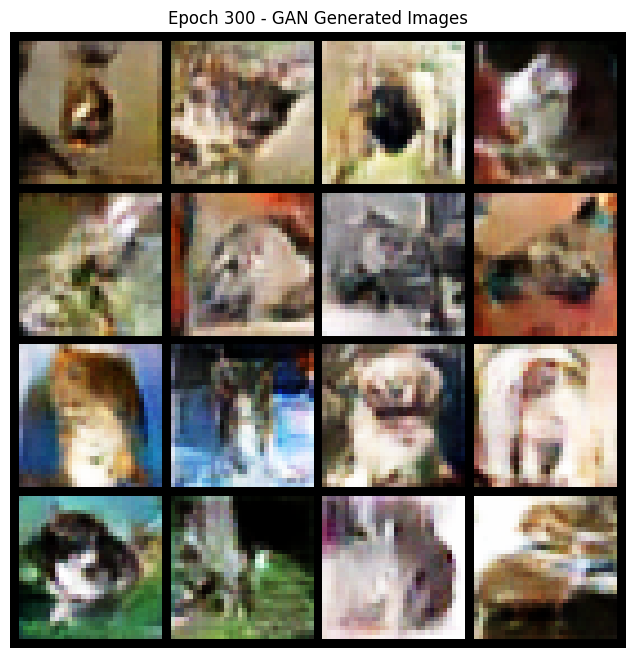

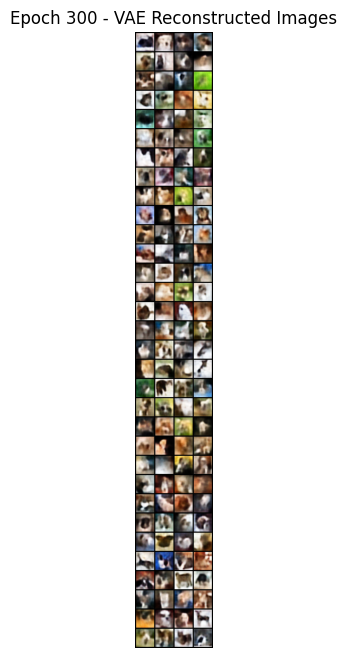

 75% (300 of 400) |################      | Elapsed Time: 1:21:49 ETA:   0:27:16

Epoch [301/400] - GAN D Loss: -14.0007, G Loss: 5.4802, VAE Loss: 21980.0436


 75% (301 of 400) |################      | Elapsed Time: 1:22:06 ETA:   0:27:00

Epoch [302/400] - GAN D Loss: -21.5307, G Loss: 5.8500, VAE Loss: 21982.9277


 75% (302 of 400) |################      | Elapsed Time: 1:22:22 ETA:   0:26:43

Epoch [303/400] - GAN D Loss: -16.9450, G Loss: 9.4332, VAE Loss: 21997.5697


 75% (303 of 400) |################      | Elapsed Time: 1:22:38 ETA:   0:26:27

Epoch [304/400] - GAN D Loss: -12.6951, G Loss: 7.3020, VAE Loss: 21963.0647


 76% (304 of 400) |################      | Elapsed Time: 1:22:55 ETA:   0:26:11

Epoch [305/400] - GAN D Loss: -18.7666, G Loss: 7.0248, VAE Loss: 21981.7986


 76% (305 of 400) |################      | Elapsed Time: 1:23:11 ETA:   0:25:54

Epoch [306/400] - GAN D Loss: -18.8247, G Loss: 7.0030, VAE Loss: 21941.0452


 76% (306 of 400) |################      | Elapsed Time: 1:23:27 ETA:   0:25:38

Epoch [307/400] - GAN D Loss: -7.8753, G Loss: 6.6629, VAE Loss: 21925.4489


 76% (307 of 400) |################      | Elapsed Time: 1:23:44 ETA:   0:25:21

Epoch [308/400] - GAN D Loss: 5.3556, G Loss: 6.5592, VAE Loss: 21946.6582


 77% (308 of 400) |################      | Elapsed Time: 1:24:00 ETA:   0:25:05

Epoch [309/400] - GAN D Loss: -3.3900, G Loss: 5.1538, VAE Loss: 21956.6751


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [310/400] - GAN D Loss: -11.4786, G Loss: 5.6653, VAE Loss: 21966.3135


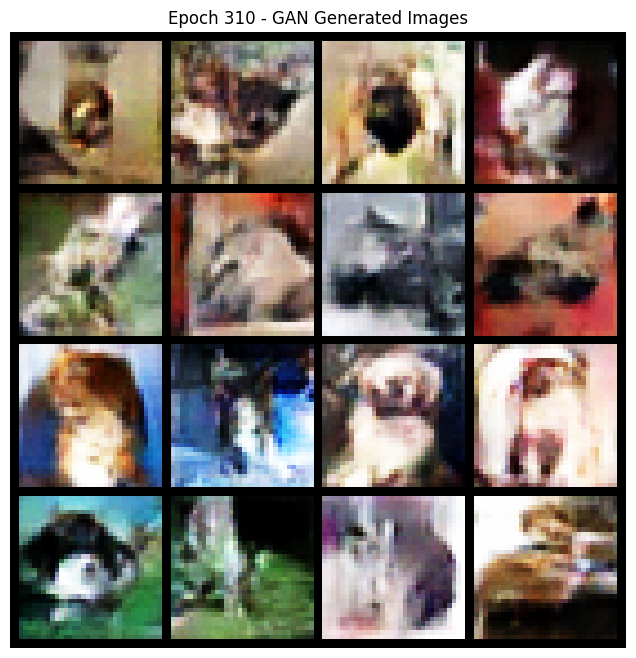

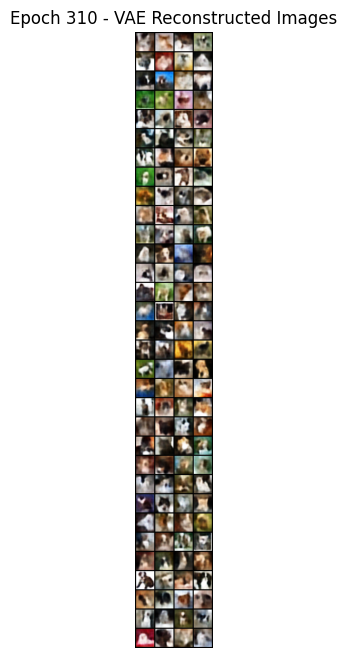

 77% (310 of 400) |#################     | Elapsed Time: 1:24:33 ETA:   0:24:32

Epoch [311/400] - GAN D Loss: -10.1947, G Loss: 6.7452, VAE Loss: 21961.0560


 77% (311 of 400) |#################     | Elapsed Time: 1:24:49 ETA:   0:24:16

Epoch [312/400] - GAN D Loss: -13.3432, G Loss: 7.9139, VAE Loss: 21968.4378


 78% (312 of 400) |#################     | Elapsed Time: 1:25:06 ETA:   0:24:00

Epoch [313/400] - GAN D Loss: -15.2953, G Loss: 8.8889, VAE Loss: 21923.5887


 78% (313 of 400) |#################     | Elapsed Time: 1:25:22 ETA:   0:23:43

Epoch [314/400] - GAN D Loss: -24.9398, G Loss: 8.4238, VAE Loss: 21920.4431


 78% (314 of 400) |#################     | Elapsed Time: 1:25:38 ETA:   0:23:27

Epoch [315/400] - GAN D Loss: -12.3762, G Loss: 6.3789, VAE Loss: 21932.0301


 78% (315 of 400) |#################     | Elapsed Time: 1:25:55 ETA:   0:23:11

Epoch [316/400] - GAN D Loss: -15.1961, G Loss: 8.8723, VAE Loss: 21935.6162


 79% (316 of 400) |#################     | Elapsed Time: 1:26:11 ETA:   0:22:54

Epoch [317/400] - GAN D Loss: -20.5838, G Loss: 10.2148, VAE Loss: 21924.8167


 79% (317 of 400) |#################     | Elapsed Time: 1:26:28 ETA:   0:22:38

Epoch [318/400] - GAN D Loss: -10.3419, G Loss: 6.6657, VAE Loss: 21906.6310


 79% (318 of 400) |#################     | Elapsed Time: 1:26:44 ETA:   0:22:22

Epoch [319/400] - GAN D Loss: -3.0084, G Loss: 5.6665, VAE Loss: 21936.5690


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [320/400] - GAN D Loss: -22.3846, G Loss: 6.7186, VAE Loss: 21917.3092


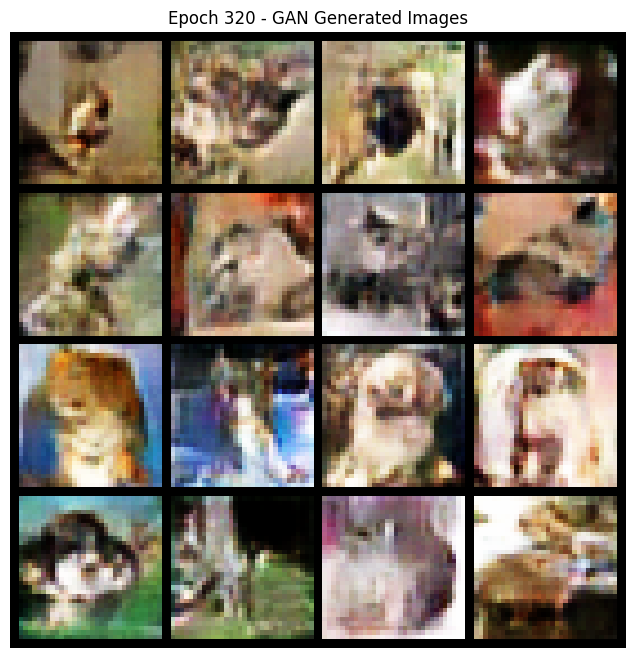

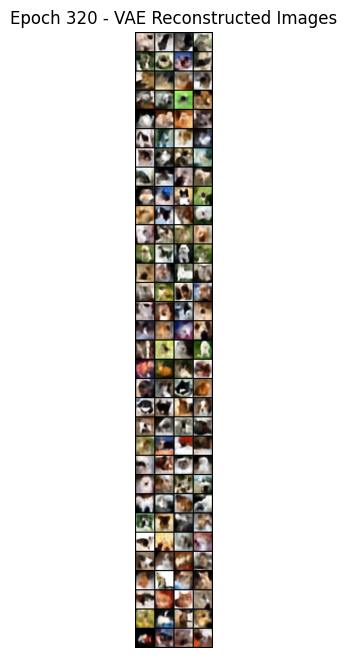

 80% (320 of 400) |#################     | Elapsed Time: 1:27:17 ETA:   0:21:49

Epoch [321/400] - GAN D Loss: -10.0281, G Loss: 8.1890, VAE Loss: 21905.5569


 80% (321 of 400) |#################     | Elapsed Time: 1:27:33 ETA:   0:21:32

Epoch [322/400] - GAN D Loss: -14.4125, G Loss: 9.8457, VAE Loss: 21893.6384


 80% (322 of 400) |#################     | Elapsed Time: 1:27:49 ETA:   0:21:16

Epoch [323/400] - GAN D Loss: -5.5475, G Loss: 8.2157, VAE Loss: 21918.0566


 80% (323 of 400) |#################     | Elapsed Time: 1:28:06 ETA:   0:21:00

Epoch [324/400] - GAN D Loss: -22.7536, G Loss: 8.2043, VAE Loss: 21910.1857


 81% (324 of 400) |#################     | Elapsed Time: 1:28:22 ETA:   0:20:43

Epoch [325/400] - GAN D Loss: -14.0150, G Loss: 10.4451, VAE Loss: 21886.3198


 81% (325 of 400) |#################     | Elapsed Time: 1:28:38 ETA:   0:20:27

Epoch [326/400] - GAN D Loss: -32.1798, G Loss: 9.9875, VAE Loss: 21911.6088


 81% (326 of 400) |#################     | Elapsed Time: 1:28:55 ETA:   0:20:11

Epoch [327/400] - GAN D Loss: -27.0095, G Loss: 7.2950, VAE Loss: 21893.4920


 81% (327 of 400) |#################     | Elapsed Time: 1:29:11 ETA:   0:19:54

Epoch [328/400] - GAN D Loss: -22.2436, G Loss: 10.3905, VAE Loss: 21878.2830


 82% (328 of 400) |##################    | Elapsed Time: 1:29:27 ETA:   0:19:38

Epoch [329/400] - GAN D Loss: -10.0749, G Loss: 10.0830, VAE Loss: 21882.0983


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [330/400] - GAN D Loss: -11.9962, G Loss: 10.2755, VAE Loss: 21864.6991


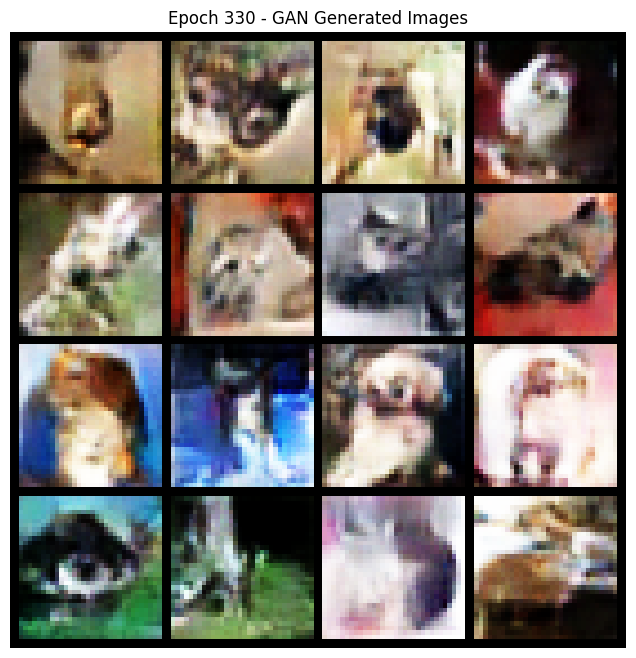

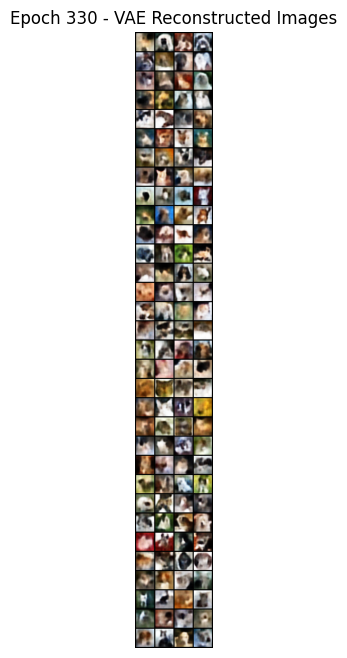

 82% (330 of 400) |##################    | Elapsed Time: 1:30:00 ETA:   0:19:05

Epoch [331/400] - GAN D Loss: -11.4584, G Loss: 10.9486, VAE Loss: 21875.7008


 82% (331 of 400) |##################    | Elapsed Time: 1:30:16 ETA:   0:18:49

Epoch [332/400] - GAN D Loss: -18.5183, G Loss: 11.1162, VAE Loss: 21886.1286


 83% (332 of 400) |##################    | Elapsed Time: 1:30:33 ETA:   0:18:32

Epoch [333/400] - GAN D Loss: -8.8029, G Loss: 14.1511, VAE Loss: 21853.2028


 83% (333 of 400) |##################    | Elapsed Time: 1:30:49 ETA:   0:18:16

Epoch [334/400] - GAN D Loss: -24.6692, G Loss: 13.2287, VAE Loss: 21853.3674


 83% (334 of 400) |##################    | Elapsed Time: 1:31:05 ETA:   0:18:00

Epoch [335/400] - GAN D Loss: -6.2260, G Loss: 11.1613, VAE Loss: 21825.7386


 83% (335 of 400) |##################    | Elapsed Time: 1:31:21 ETA:   0:17:43

Epoch [336/400] - GAN D Loss: -8.5407, G Loss: 12.3921, VAE Loss: 21845.1914


 84% (336 of 400) |##################    | Elapsed Time: 1:31:38 ETA:   0:17:27

Epoch [337/400] - GAN D Loss: -15.8472, G Loss: 11.6358, VAE Loss: 21881.7060


 84% (337 of 400) |##################    | Elapsed Time: 1:31:54 ETA:   0:17:10

Epoch [338/400] - GAN D Loss: -18.6148, G Loss: 13.3745, VAE Loss: 21848.5812


 84% (338 of 400) |##################    | Elapsed Time: 1:32:10 ETA:   0:16:54

Epoch [339/400] - GAN D Loss: -23.3422, G Loss: 14.3192, VAE Loss: 21813.1019


 98% (78 of 79) |####################### | Elapsed Time: 0:00:16 ETA:   0:00:00

Epoch [340/400] - GAN D Loss: -18.5100, G Loss: 11.8749, VAE Loss: 21825.1105


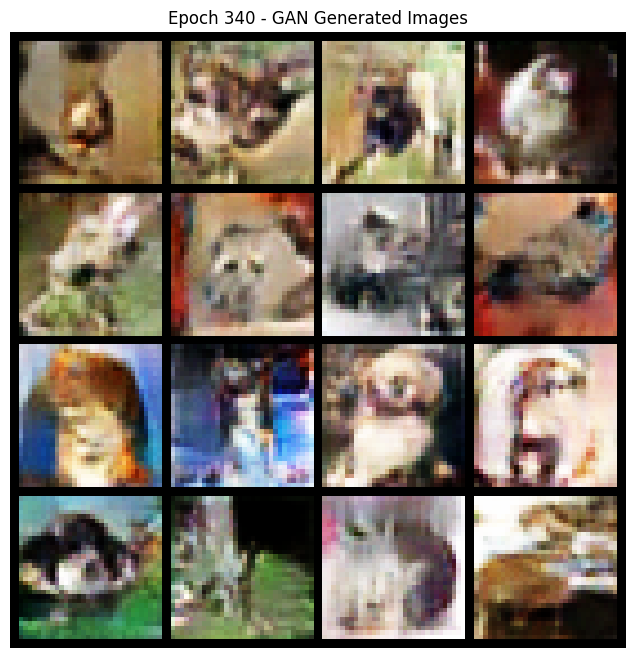

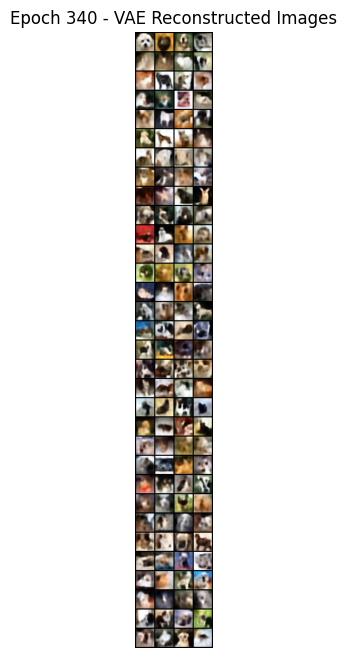

 85% (340 of 400) |##################    | Elapsed Time: 1:32:44 ETA:   0:16:21

Epoch [341/400] - GAN D Loss: -29.0544, G Loss: 15.5085, VAE Loss: 21848.0328


 85% (341 of 400) |##################    | Elapsed Time: 1:33:00 ETA:   0:16:05

Epoch [342/400] - GAN D Loss: -28.5862, G Loss: 13.3113, VAE Loss: 21834.4876


 85% (342 of 400) |##################    | Elapsed Time: 1:33:16 ETA:   0:15:49

Epoch [343/400] - GAN D Loss: -24.7388, G Loss: 11.9307, VAE Loss: 21829.4897


 85% (343 of 400) |##################    | Elapsed Time: 1:33:33 ETA:   0:15:32

Epoch [344/400] - GAN D Loss: -13.1807, G Loss: 14.2484, VAE Loss: 21849.8688


 86% (344 of 400) |##################    | Elapsed Time: 1:33:49 ETA:   0:15:16

Epoch [345/400] - GAN D Loss: -4.9014, G Loss: 15.2445, VAE Loss: 21810.2344


 86% (345 of 400) |##################    | Elapsed Time: 1:34:05 ETA:   0:15:00

Epoch [346/400] - GAN D Loss: -23.7331, G Loss: 20.6351, VAE Loss: 21803.8130


 86% (346 of 400) |###################   | Elapsed Time: 1:34:22 ETA:   0:14:43

Epoch [347/400] - GAN D Loss: -24.9500, G Loss: 14.8619, VAE Loss: 21803.6411


 86% (347 of 400) |###################   | Elapsed Time: 1:34:38 ETA:   0:14:27

Epoch [348/400] - GAN D Loss: -16.1708, G Loss: 17.1740, VAE Loss: 21840.3211


 87% (348 of 400) |###################   | Elapsed Time: 1:34:54 ETA:   0:14:10

Epoch [349/400] - GAN D Loss: -14.9322, G Loss: 14.9514, VAE Loss: 21778.8459


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [350/400] - GAN D Loss: -21.4385, G Loss: 17.1509, VAE Loss: 21805.6681


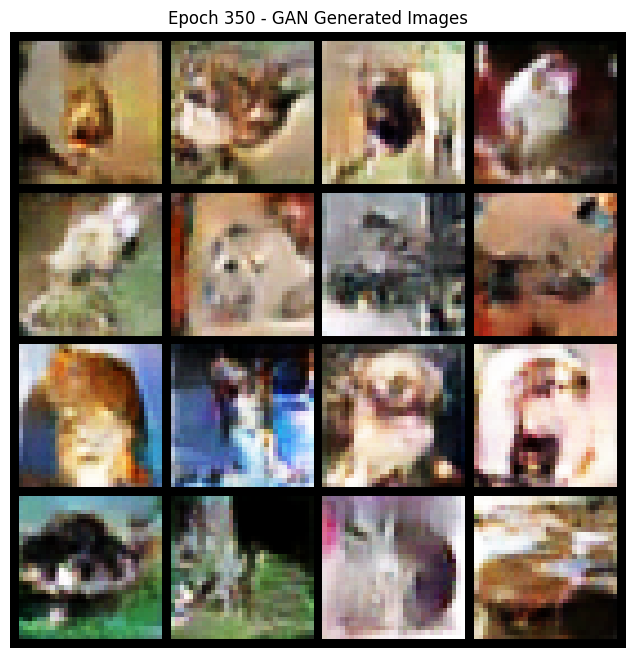

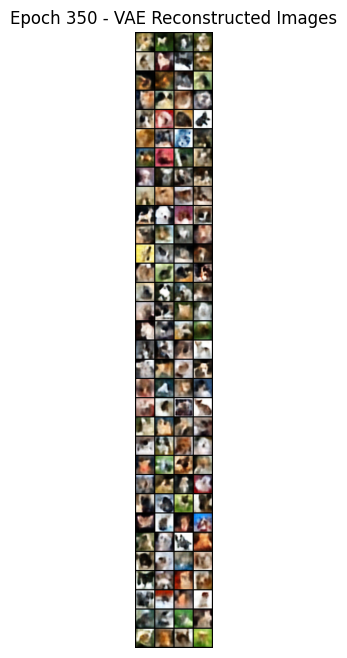

 87% (350 of 400) |###################   | Elapsed Time: 1:35:27 ETA:   0:13:38

Epoch [351/400] - GAN D Loss: -28.1637, G Loss: 16.3633, VAE Loss: 21797.7014


 87% (351 of 400) |###################   | Elapsed Time: 1:35:43 ETA:   0:13:21

Epoch [352/400] - GAN D Loss: -43.2884, G Loss: 20.2679, VAE Loss: 21823.2207


 88% (352 of 400) |###################   | Elapsed Time: 1:36:00 ETA:   0:13:05

Epoch [353/400] - GAN D Loss: -27.7321, G Loss: 18.5248, VAE Loss: 21806.3140


 88% (353 of 400) |###################   | Elapsed Time: 1:36:16 ETA:   0:12:49

Epoch [354/400] - GAN D Loss: -15.8363, G Loss: 20.9179, VAE Loss: 21785.2685


 88% (354 of 400) |###################   | Elapsed Time: 1:36:32 ETA:   0:12:32

Epoch [355/400] - GAN D Loss: -21.3177, G Loss: 21.4571, VAE Loss: 21766.8517


 88% (355 of 400) |###################   | Elapsed Time: 1:36:49 ETA:   0:12:16

Epoch [356/400] - GAN D Loss: -43.9144, G Loss: 16.8210, VAE Loss: 21761.6504


 89% (356 of 400) |###################   | Elapsed Time: 1:37:05 ETA:   0:12:00

Epoch [357/400] - GAN D Loss: -16.1771, G Loss: 17.2766, VAE Loss: 21756.8037


 89% (357 of 400) |###################   | Elapsed Time: 1:37:21 ETA:   0:11:43

Epoch [358/400] - GAN D Loss: -32.7283, G Loss: 17.5484, VAE Loss: 21767.4121


 89% (358 of 400) |###################   | Elapsed Time: 1:37:38 ETA:   0:11:27

Epoch [359/400] - GAN D Loss: -30.0967, G Loss: 20.2630, VAE Loss: 21758.4151


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [360/400] - GAN D Loss: -32.8765, G Loss: 18.2918, VAE Loss: 21753.8852


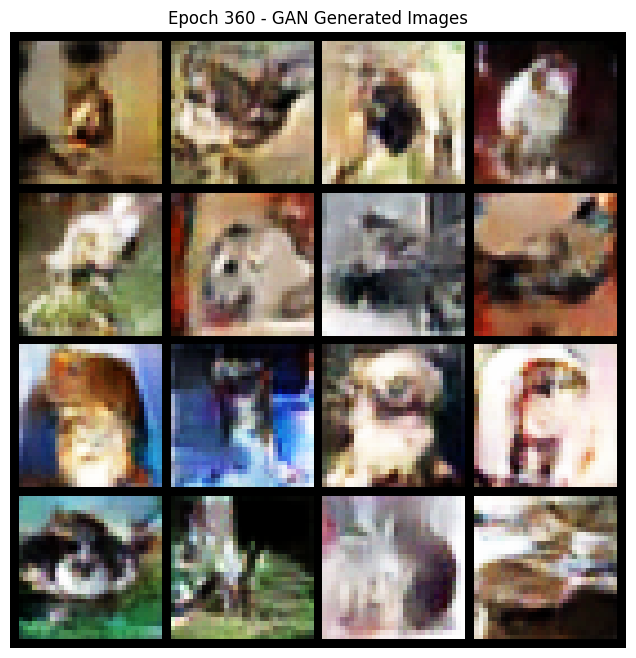

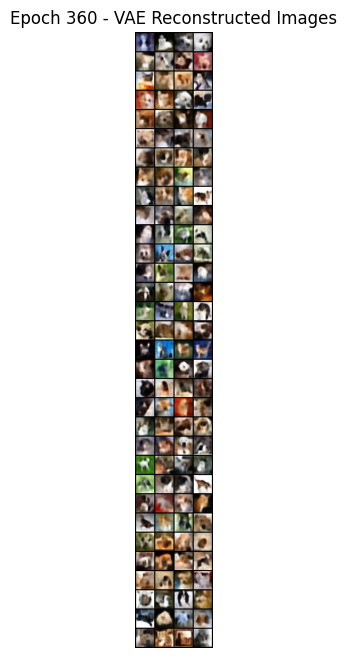

 90% (360 of 400) |###################   | Elapsed Time: 1:38:11 ETA:   0:10:54

Epoch [361/400] - GAN D Loss: -23.7664, G Loss: 21.8563, VAE Loss: 21741.5706


 90% (361 of 400) |###################   | Elapsed Time: 1:38:27 ETA:   0:10:38

Epoch [362/400] - GAN D Loss: -13.0899, G Loss: 19.3882, VAE Loss: 21765.5468


 90% (362 of 400) |###################   | Elapsed Time: 1:38:43 ETA:   0:10:21

Epoch [363/400] - GAN D Loss: -24.2528, G Loss: 22.2427, VAE Loss: 21750.7279


 90% (363 of 400) |###################   | Elapsed Time: 1:38:59 ETA:   0:10:05

Epoch [364/400] - GAN D Loss: -16.2950, G Loss: 20.4527, VAE Loss: 21771.5288


 91% (364 of 400) |####################  | Elapsed Time: 1:39:16 ETA:   0:09:49

Epoch [365/400] - GAN D Loss: -9.2710, G Loss: 21.0112, VAE Loss: 21743.7455


 91% (365 of 400) |####################  | Elapsed Time: 1:39:32 ETA:   0:09:32

Epoch [366/400] - GAN D Loss: -27.6561, G Loss: 19.9557, VAE Loss: 21744.3044


 91% (366 of 400) |####################  | Elapsed Time: 1:39:48 ETA:   0:09:16

Epoch [367/400] - GAN D Loss: -48.5144, G Loss: 21.8454, VAE Loss: 21752.0255


 91% (367 of 400) |####################  | Elapsed Time: 1:40:05 ETA:   0:08:59

Epoch [368/400] - GAN D Loss: -30.2713, G Loss: 19.2935, VAE Loss: 21740.7668


 92% (368 of 400) |####################  | Elapsed Time: 1:40:21 ETA:   0:08:43

Epoch [369/400] - GAN D Loss: -48.6875, G Loss: 21.0806, VAE Loss: 21698.4144


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [370/400] - GAN D Loss: -35.1292, G Loss: 22.2184, VAE Loss: 21738.2967


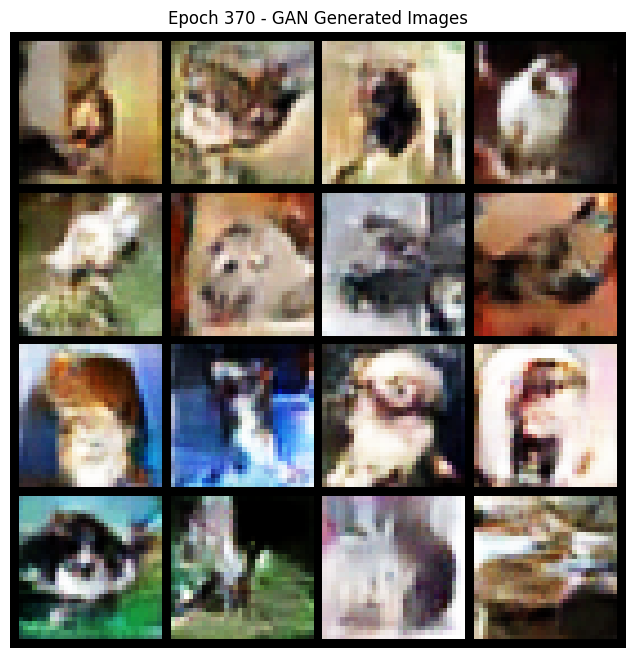

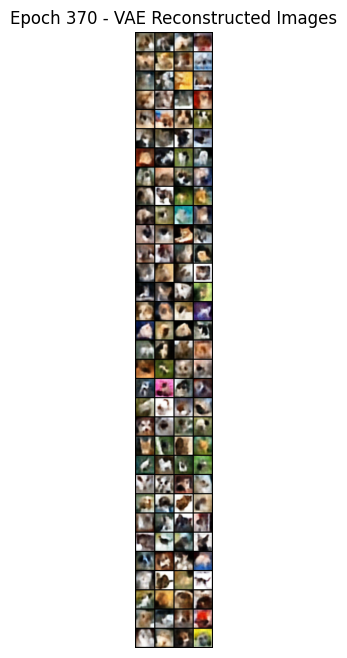

 92% (370 of 400) |####################  | Elapsed Time: 1:40:54 ETA:   0:08:10

Epoch [371/400] - GAN D Loss: -23.8109, G Loss: 22.2622, VAE Loss: 21702.5008


 92% (371 of 400) |####################  | Elapsed Time: 1:41:10 ETA:   0:07:54

Epoch [372/400] - GAN D Loss: -30.6479, G Loss: 22.4204, VAE Loss: 21708.6132


 93% (372 of 400) |####################  | Elapsed Time: 1:41:27 ETA:   0:07:38

Epoch [373/400] - GAN D Loss: -45.7523, G Loss: 21.3658, VAE Loss: 21733.3509


 93% (373 of 400) |####################  | Elapsed Time: 1:41:43 ETA:   0:07:21

Epoch [374/400] - GAN D Loss: -40.6438, G Loss: 18.7633, VAE Loss: 21729.9208


 93% (374 of 400) |####################  | Elapsed Time: 1:41:59 ETA:   0:07:05

Epoch [375/400] - GAN D Loss: 288.6683, G Loss: 24.4611, VAE Loss: 21755.1247


 93% (375 of 400) |####################  | Elapsed Time: 1:42:16 ETA:   0:06:49

Epoch [376/400] - GAN D Loss: 9.4748, G Loss: 9.3311, VAE Loss: 21726.8141


 94% (376 of 400) |####################  | Elapsed Time: 1:42:32 ETA:   0:06:32

Epoch [377/400] - GAN D Loss: -34.6656, G Loss: 23.9399, VAE Loss: 21673.5598


 94% (377 of 400) |####################  | Elapsed Time: 1:42:48 ETA:   0:06:16

Epoch [378/400] - GAN D Loss: -26.4793, G Loss: 24.3108, VAE Loss: 21706.9042


 94% (378 of 400) |####################  | Elapsed Time: 1:43:04 ETA:   0:05:59

Epoch [379/400] - GAN D Loss: -7.6986, G Loss: 25.0289, VAE Loss: 21688.3464


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [380/400] - GAN D Loss: -35.9235, G Loss: 21.8538, VAE Loss: 21701.8494


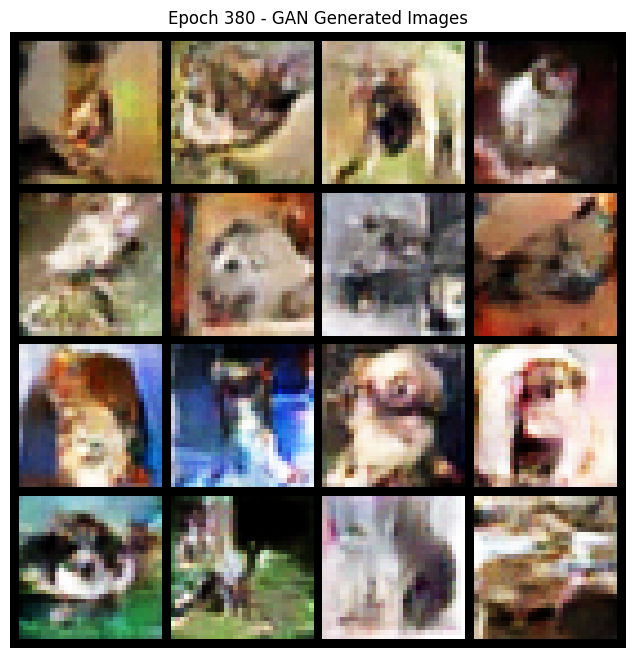

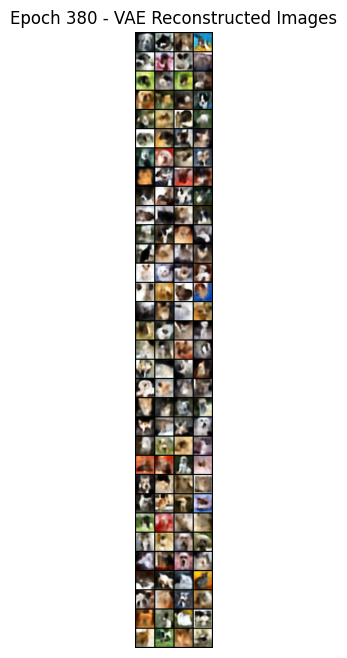

 95% (380 of 400) |####################  | Elapsed Time: 1:43:38 ETA:   0:05:27

Epoch [381/400] - GAN D Loss: -22.8364, G Loss: 25.8841, VAE Loss: 21700.0744


 95% (381 of 400) |####################  | Elapsed Time: 1:43:54 ETA:   0:05:10

Epoch [382/400] - GAN D Loss: -43.4322, G Loss: 29.3793, VAE Loss: 21704.3692


 95% (382 of 400) |##################### | Elapsed Time: 1:44:10 ETA:   0:04:54

Epoch [383/400] - GAN D Loss: -67.3347, G Loss: 34.7292, VAE Loss: 21690.1792


 95% (383 of 400) |##################### | Elapsed Time: 1:44:27 ETA:   0:04:38

Epoch [384/400] - GAN D Loss: 4.0051, G Loss: 23.1704, VAE Loss: 21704.9506


 96% (384 of 400) |##################### | Elapsed Time: 1:44:43 ETA:   0:04:21

Epoch [385/400] - GAN D Loss: -18.9043, G Loss: 27.1755, VAE Loss: 21694.6927


 96% (385 of 400) |##################### | Elapsed Time: 1:44:59 ETA:   0:04:05

Epoch [386/400] - GAN D Loss: -50.2071, G Loss: 28.0022, VAE Loss: 21673.8031


 96% (386 of 400) |##################### | Elapsed Time: 1:45:16 ETA:   0:03:49

Epoch [387/400] - GAN D Loss: -40.0575, G Loss: 27.6716, VAE Loss: 21661.2812


 96% (387 of 400) |##################### | Elapsed Time: 1:45:32 ETA:   0:03:32

Epoch [388/400] - GAN D Loss: -51.3627, G Loss: 25.8723, VAE Loss: 21725.2237


 97% (388 of 400) |##################### | Elapsed Time: 1:45:48 ETA:   0:03:16

Epoch [389/400] - GAN D Loss: -42.6044, G Loss: 25.3767, VAE Loss: 21668.7897


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [390/400] - GAN D Loss: -45.5963, G Loss: 31.5599, VAE Loss: 21675.5882


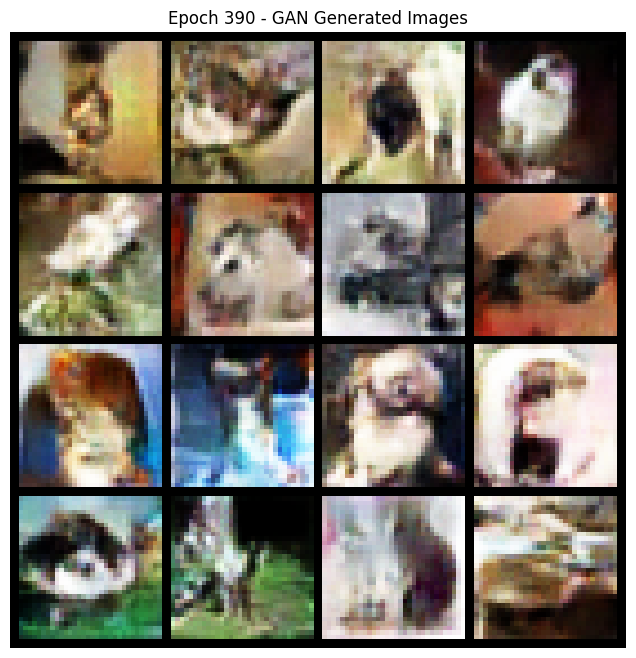

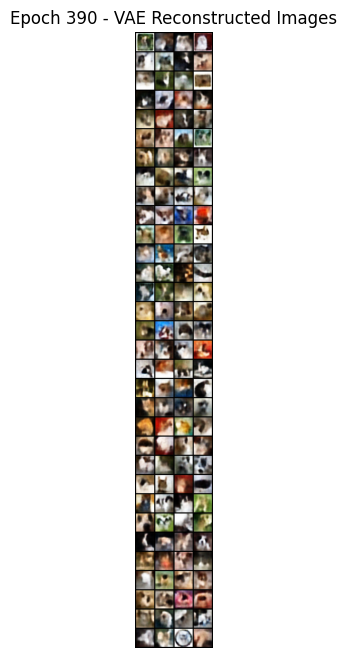

 97% (390 of 400) |##################### | Elapsed Time: 1:46:21 ETA:   0:02:43

Epoch [391/400] - GAN D Loss: -40.7751, G Loss: 24.9317, VAE Loss: 21649.3392


 97% (391 of 400) |##################### | Elapsed Time: 1:46:38 ETA:   0:02:27

Epoch [392/400] - GAN D Loss: -36.9149, G Loss: 28.9391, VAE Loss: 21666.5883


 98% (392 of 400) |##################### | Elapsed Time: 1:46:54 ETA:   0:02:10

Epoch [393/400] - GAN D Loss: -42.5862, G Loss: 26.7870, VAE Loss: 21679.5928


 98% (393 of 400) |##################### | Elapsed Time: 1:47:10 ETA:   0:01:54

Epoch [394/400] - GAN D Loss: -2.7678, G Loss: 25.5933, VAE Loss: 21668.3286


 98% (394 of 400) |##################### | Elapsed Time: 1:47:27 ETA:   0:01:38

Epoch [395/400] - GAN D Loss: -26.4243, G Loss: 35.2604, VAE Loss: 21659.7653


 98% (395 of 400) |##################### | Elapsed Time: 1:47:43 ETA:   0:01:21

Epoch [396/400] - GAN D Loss: -60.0012, G Loss: 30.4126, VAE Loss: 21656.4697


 99% (396 of 400) |##################### | Elapsed Time: 1:47:59 ETA:   0:01:05

Epoch [397/400] - GAN D Loss: 465.5089, G Loss: 28.3132, VAE Loss: 21650.0075


 99% (397 of 400) |##################### | Elapsed Time: 1:48:16 ETA:   0:00:49

Epoch [398/400] - GAN D Loss: -4.2862, G Loss: 26.1877, VAE Loss: 21657.8208


 99% (398 of 400) |##################### | Elapsed Time: 1:48:32 ETA:   0:00:32

Epoch [399/400] - GAN D Loss: -51.2580, G Loss: 33.0873, VAE Loss: 21645.9971


 98% (78 of 79) |####################### | Elapsed Time: 0:00:15 ETA:   0:00:00

Epoch [400/400] - GAN D Loss: -48.6862, G Loss: 28.9335, VAE Loss: 21642.2917


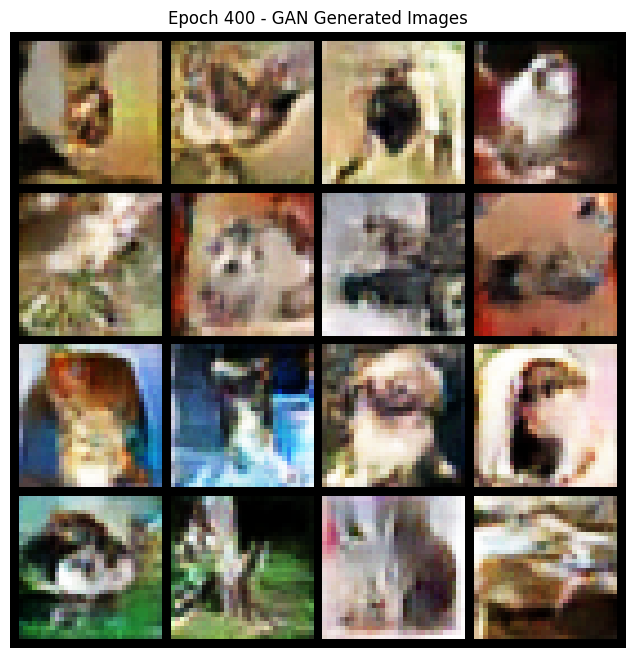

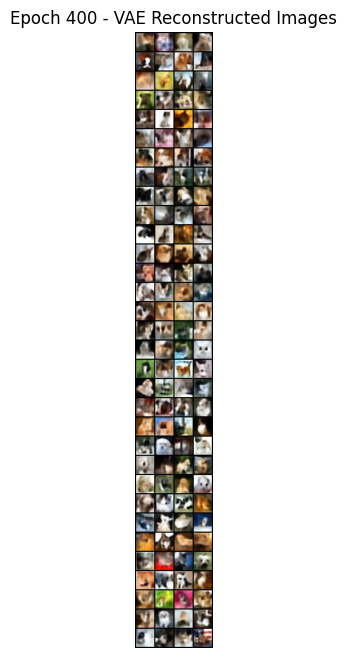

 99% (399 of 400) |##################### | Elapsed Time: 1:48:49 ETA:   0:00:16

In [9]:
# -------------------------
# Training Loop: Train GAN (WGAN-GP) and VAE concurrently, record loss curves.
# -------------------------
gan_d_losses = []  # Discriminator (critic) loss (WGAN)
gan_g_losses = []  # Generator loss
vae_losses   = []

print("Starting Training Loop...")
progress_global = progressbar.ProgressBar(max_value=NUM_EPOCHS)
for epoch in range(NUM_EPOCHS):
    d_running_loss = 0.0
    g_running_loss = 0.0
    vae_running_loss = 0.0
    progress = progressbar.ProgressBar(max_value=len(data_loader))
    
    for n_batch, (real_batch, _) in enumerate(data_loader):
        real_data = Variable(real_batch).to(device)
        
        # ---------------------
        # GAN: Train Discriminator (Critic)
        # ---------------------
        # Generate fake images (detach so gradients do not flow into generator)
        fake_data = generator(sample_noise(real_data.size(0))).detach()
        d_optimizer.zero_grad()
        real_validity = discriminator(real_data)
        fake_validity = discriminator(fake_data)
        gradient_penalty = compute_gradient_penalty(discriminator, real_data, fake_data)
        d_loss = -torch.mean(real_validity) + torch.mean(fake_validity) + LAMBDA_GP * gradient_penalty
        d_loss.backward()
        d_optimizer.step()
        
        # ---------------------
        # GAN: Train Generator
        # ---------------------
        g_optimizer.zero_grad()
        fake_data = generator(sample_noise(real_data.size(0)))
        # Generator loss: try to have critic output high (like real)
        g_loss = -torch.mean(discriminator(fake_data))
        g_loss.backward()
        g_optimizer.step()
        
        # ---------------------
        # VAE: Train on real images
        # ---------------------
        vae_optimizer.zero_grad()
        recon_images, mu, logvar = vae(real_data)
        loss_vae = vae_loss(recon_images, real_data, mu, logvar)
        loss_vae.backward()
        vae_optimizer.step()
        
        d_running_loss += d_loss.item()
        g_running_loss += g_loss.item()
        vae_running_loss += loss_vae.item()
        
        progress.update(n_batch)
        
    d_loss_epoch = d_running_loss / len(data_loader)
    g_loss_epoch = g_running_loss / len(data_loader)
    vae_loss_epoch = vae_running_loss / len(data_loader)
    gan_d_losses.append(d_loss_epoch)
    gan_g_losses.append(g_loss_epoch)
    vae_losses.append(vae_loss_epoch)
    
    print(f"Epoch [{epoch+1}/{NUM_EPOCHS}] - GAN D Loss: {d_loss_epoch:.4f}, G Loss: {g_loss_epoch:.4f}, VAE Loss: {vae_loss_epoch:.4f}")
    
    # Every 10 epochs, display outputs from both GAN and VAE.
    if (epoch + 1) % 10 == 0:
        with torch.no_grad():
            # GAN output
            gen_images = generator(fixed_noise)
            generate_and_display_images(gen_images, NUM_TEST_SAMPLES, title=f"Epoch {epoch+1} - GAN Generated Images")
            # VAE output: take a fixed batch from the data_loader
            test_batch, _ = next(iter(data_loader))
            test_batch = test_batch.to(device)
            recon_images, _, _ = vae(test_batch)
            generate_and_display_images(recon_images, NUM_TEST_SAMPLES, title=f"Epoch {epoch+1} - VAE Reconstructed Images")
    
    progress_global.update(epoch)

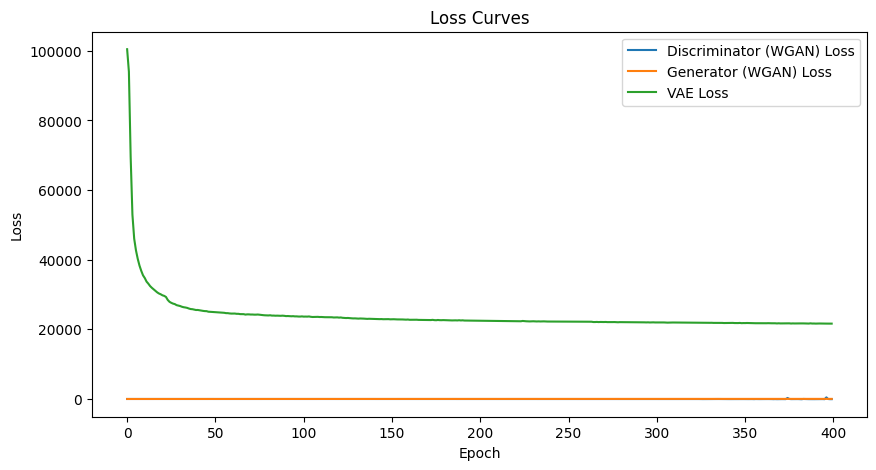

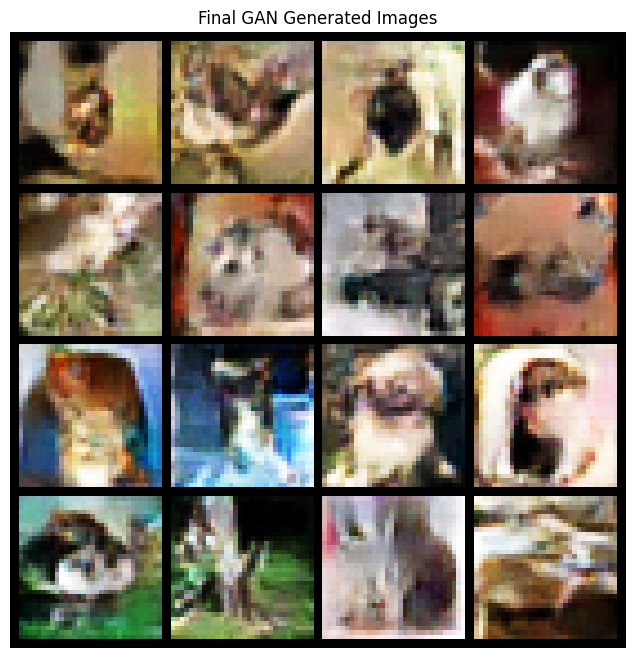

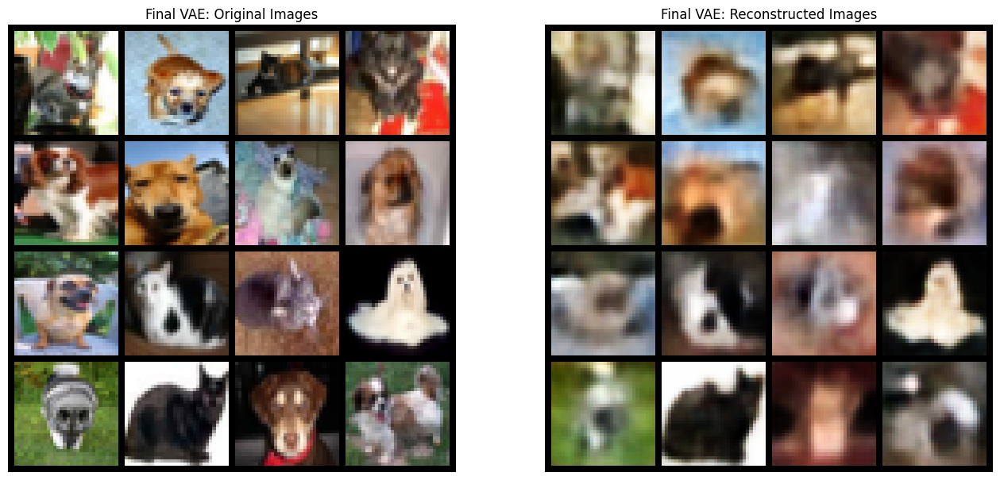

In [10]:
# -------------------------
# Plot Loss Curves
# -------------------------
plt.figure(figsize=(10,5))
plt.title("Loss Curves")
plt.plot(gan_d_losses, label="Discriminator (WGAN) Loss")
plt.plot(gan_g_losses, label="Generator (WGAN) Loss")
plt.plot(vae_losses, label="VAE Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# -------------------------
# Final Evaluation: Display Final Outputs for GAN and VAE
# -------------------------
with torch.no_grad():
    final_gen_images = generator(fixed_noise)
    generate_and_display_images(final_gen_images, NUM_TEST_SAMPLES, title="Final GAN Generated Images")
    
    test_batch, _ = next(iter(data_loader))
    test_batch = test_batch.to(device)
    recon_images, _, _ = vae(test_batch)
    real_grid = vutils.make_grid(test_batch[:NUM_TEST_SAMPLES], nrow=4, normalize=True, scale_each=True)
    recon_grid = vutils.make_grid(recon_images[:NUM_TEST_SAMPLES], nrow=4, normalize=True, scale_each=True)
    
    plt.figure(figsize=(16,8))
    plt.subplot(1,2,1)
    plt.imshow(np.transpose(real_grid.cpu().numpy(), (1,2,0)))
    plt.title("Final VAE: Original Images")
    plt.axis("off")
    
    plt.subplot(1,2,2)
    plt.imshow(np.transpose(recon_grid.cpu().numpy(), (1,2,0)))
    plt.title("Final VAE: Reconstructed Images")
    plt.axis("off")
    plt.show()

In [11]:
# -------------------------
# Save Final Models
# -------------------------
os.makedirs("models", exist_ok=True)
torch.save(generator.state_dict(), './models/generator_final.pth')
torch.save(discriminator.state_dict(), './models/discriminator_final.pth')
torch.save(vae.state_dict(), './models/vae_final.pth')
print("Models saved successfully.")

Models saved successfully.
